In [96]:
# importing packages
import pandas as pd
import numpy as np
import seaborn as sns
import datetime as dt
from cmath import sqrt
import warnings
import matplotlib.pyplot as plt
import datetime
import datetime as dt
import sklearn
import folium
import warnings
import pydotplus
import six
import sys
import statistics as st
sys.modules['sklearn.externals.six'] = six
warnings.filterwarnings('ignore')

# import ML packages
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder#for train test splitting
from sklearn.model_selection import train_test_split#for decision tree object
from sklearn.tree import DecisionTreeClassifier#for checking testing results
from sklearn.metrics import classification_report, confusion_matrix#for visualizing tree 
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image 
from pandas.plotting import scatter_matrix
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

#for interactive analysis
from ipywidgets import interact

%matplotlib inline

# IRELAND

# IRISH Crops Dataset

In [2]:
#Reading in Irish Crops dataset from between 2010 to 2020 8 actions 10 crop measurements and 139 crop types
irelandagri_crops = pd.read_csv('ireland/FAOSTAT_data_5-1-2022 (2).csv')
irelandagri_crops.head()

,Domain,Area,Element,Item,Year,Unit,Value
0,Crops and livestock products,Ireland,Area harvested,"Almonds, with shell",2018,ha,0.0
1,Crops and livestock products,Ireland,Area harvested,"Almonds, with shell",2019,ha,0.0
2,Crops and livestock products,Ireland,Area harvested,"Almonds, with shell",2020,ha,0.0
3,Crops and livestock products,Ireland,Production,"Almonds, with shell",2018,tonnes,0.0
4,Crops and livestock products,Ireland,Production,"Almonds, with shell",2019,tonnes,0.0


In [3]:
#reading the last 5 rows of the dataframe
irelandagri_crops.tail()

,Domain,Area,Element,Item,Year,Unit,Value
2124,Crops and livestock products,Ireland,Production,"Wool, greasy",2013,tonnes,14000.0
2125,Crops and livestock products,Ireland,Production,"Wool, greasy",2014,tonnes,14031.0
2126,Crops and livestock products,Ireland,Production,"Wool, greasy",2015,tonnes,14123.0
2127,Crops and livestock products,Ireland,Production,"Wool, greasy",2016,tonnes,14330.0
2128,Crops and livestock products,Ireland,Production,"Wool, greasy",2017,tonnes,14436.0


In [4]:
# inspect description of variables
irelandagri_crops.describe()

,Year,Value
count,2129.000000,1.985000e+03
mean,2015.056364,3.845486e+05
std,3.161180,1.060809e+06
min,2010.000000,0.000000e+00
25%,2012.000000,2.220000e+02
50%,2015.000000,9.600000e+03
75%,2018.000000,9.500000e+04
max,2020.000000,8.561470e+06


In [5]:
# remove nan or missing values from multiple colu
irelandagri_crops =  irelandagri_crops.dropna()
irelandagri_crops.head()

,Domain,Area,Element,Item,Year,Unit,Value
0,Crops and livestock products,Ireland,Area harvested,"Almonds, with shell",2018,ha,0.0
1,Crops and livestock products,Ireland,Area harvested,"Almonds, with shell",2019,ha,0.0
2,Crops and livestock products,Ireland,Area harvested,"Almonds, with shell",2020,ha,0.0
3,Crops and livestock products,Ireland,Production,"Almonds, with shell",2018,tonnes,0.0
4,Crops and livestock products,Ireland,Production,"Almonds, with shell",2019,tonnes,0.0


In [6]:
# inspect dataset information and datatypes
irelandagri_crops.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1985 entries, 0 to 2128
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Domain   1985 non-null   object 
 1   Area     1985 non-null   object 
 2   Element  1985 non-null   object 
 3   Item     1985 non-null   object 
 4   Year     1985 non-null   int64  
 5   Unit     1985 non-null   object 
 6   Value    1985 non-null   float64
dtypes: float64(1), int64(1), object(5)
memory usage: 124.1+ KB


In [7]:
# Get the shape of the irish crops dataset before we merge
irelandagri_crops.shape

(1985, 7)

# I am concentrating on crops so I have removed livestock and non crops that appear under the column item

In [8]:
# Dropping the rows of all rows under item that do not contain crops but contain livestock etc.
irelandagri_crops= irelandagri_crops[irelandagri_crops["Item"].str.contains("Asses|Beer of barley|Cattle|skimmed cow milk|Cheese, whole cow milk|Chickens|Cream fresh|Ducks|Eggs, hen, in shell|Fat, cattle|Fat, pigs|Fat, sheep|Geese and guinea fowls|Goats|Hides, cattle, fresh|Honey, natural|Hops|Horses|Lard|Margarine, short|Meat nes|Meat, cattle|Meat, chicken|Meat, duck Meat, goose and guinea fowl|Meat, horse|Meat, pig|Meat, sheep|Meat, turkey|Milk, skimmed cow|Milk, skimmed dried|Milk, whole condensed|Milk, whole dried|Milk, whole evaporated|Milk, whole fresh cow|Mules|Offals, edible, cattle|Offals, horses|Offals, pigs, edible|Offals, sheep,edible|Oil, coconut (copra)|Oil, cottonseed|Oil, groundnut|Oil, linseed|Oil, palm kernel|Oil, rapeseed|Oil, soybean|Pigs|Rapeseed|Sheep|Skins, sheep, fresh|Sugar Raw Centrifugal|Tallow|Turkeys|fresh nes|Whey, condensed|Wool, greasy|Molasses|Almonds, with shell|Buffaloes|Cottonseed|Fat, goats|Hemp tow waste|Meat, goat|Milk, whole fresh buffalo|Milk, whole fresh goat|Milk, whole fresh sheep|Offals, edible, goats|paddy (rice milled equivalent)|Skins, goat, fresh|Sorghum|Tobacco, unmanufactured|Triticale|Meat, duck|Meat, goose and guinea fowl") == False]
# display
irelandagri_crops

,Domain,Area,Element,Item,Year,Unit,Value
6,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0
7,Crops and livestock products,Ireland,Area harvested,Apples,2011,ha,620.0
8,Crops and livestock products,Ireland,Area harvested,Apples,2012,ha,620.0
9,Crops and livestock products,Ireland,Area harvested,Apples,2013,ha,615.0
10,Crops and livestock products,Ireland,Area harvested,Apples,2014,ha,635.0
...,...,...,...,...,...,...,...
2116,Crops and livestock products,Ireland,Production,"Whey, dry",2013,tonnes,30100.0
2117,Crops and livestock products,Ireland,Production,"Whey, dry",2014,tonnes,31530.0
2118,Crops and livestock products,Ireland,Production,"Whey, dry",2015,tonnes,34856.0
2119,Crops and livestock products,Ireland,Production,"Whey, dry",2016,tonnes,34416.0


# Irish Climate Dataset

year: - Year
month: - Month
rain: - Precipitation Amount (mm)
gdf: - Greatest daily fall (mm)
rd: - Number of rain days (0.2mm or more)
"wd: - Number of wet days (1.0 mm or more) "


rain: - Precipitation Amount (mm)
meant: - Mean Air Temperature (C)
"maxtp: - Maximum Air Temperature (C) "
"mintp: - Minimum Air Temperature (C) "
mnmax: - Mean Maximum Temperature (C)
mnmin: - Mean Minimum Temperature (C)
gmin: - Grass Minimum Temperature (C)
wdsp: - Mean Wind Speed (knot)
mxgt: - Highest Gust (knot)

https://data.gov.ie/dataset/claremorris-monthly-weather-station-data

In [9]:
irish_climate = pd.read_csv('ireland/irishclimate.csv')
irish_climate.head()

,year,month,ind,rain,gdf,rd,wd,meant,maxtp,mintp,mnmax,mnmin,rain.1,gmin,wdsp,maxgt
0,2010,1,0,101.5,17.1,22,17,2.0,10.9,-11.6,5.5,-1.5,70.2,-14.5,6.8,44
1,2010,2,0,128.0,23.3,24,16,2.6,10.3,-6.1,6.6,-1.3,37.1,-10,6,31
2,2010,3,0,79.9,17.5,14,12,5.7,13.6,-6.2,10.2,1.2,73.9,-10.1,7.4,43
3,2010,4,0,112.5,14.0,27,19,9.1,19.6,-2.4,14.2,4.0,85.1,-19.9,7.1,39
4,2010,5,0,53.8,13.0,17,13,10.7,25.1,0.3,15.7,5.6,24.4,-3.2,7.2,28


In [10]:
# remove nan or missing values from multiple columns
irish_climate =  irish_climate.dropna()
irish_climate.head()

,year,month,ind,rain,gdf,rd,wd,meant,maxtp,mintp,mnmax,mnmin,rain.1,gmin,wdsp,maxgt
0,2010,1,0,101.5,17.1,22,17,2.0,10.9,-11.6,5.5,-1.5,70.2,-14.5,6.8,44
1,2010,2,0,128.0,23.3,24,16,2.6,10.3,-6.1,6.6,-1.3,37.1,-10,6,31
2,2010,3,0,79.9,17.5,14,12,5.7,13.6,-6.2,10.2,1.2,73.9,-10.1,7.4,43
3,2010,4,0,112.5,14.0,27,19,9.1,19.6,-2.4,14.2,4.0,85.1,-19.9,7.1,39
4,2010,5,0,53.8,13.0,17,13,10.7,25.1,0.3,15.7,5.6,24.4,-3.2,7.2,28


Creating a new feature called months out of month to contain the months as strings not numeric values for my visualisations later on

In [11]:
#Using lambda function in order to change the months from ints 1,2 3 etc and creating a new feature months
#This will store the months as objects/strings ie. January, February and March before Merging
import calendar
irish_climate['months'] = irish_climate['month'].apply(lambda x: calendar.month_name[x])

In [12]:
##Assigning the columns from the irish_climate dataset to be used in a left Join on year with the crops dataset
df_irish_climate = irish_climate[['year','months','gdf','rain','rd','wd','meant','maxtp','mintp','mnmin','gmin']].drop_duplicates()

In [13]:
#merging both datasets using a left Inner Join on Year and year columnn and assiging the result to a new 
#dataframe called df_irishdata
df_irishdata = pd.merge(irelandagri_crops,df_irish_climate,left_on="Year",right_on="year", how ="inner")

In [14]:
#inspectng the new dataframe usualy the default of 5 rows is enough after the merge I like to see 20 rows to ensure
#I have captured everything from both datasets and also to ensure I have not captured lots of duplicates
df_irishdata.head(20)

,Domain,Area,Element,Item,Year,Unit,Value,year,months,gdf,rain,rd,wd,meant,maxtp,mintp,mnmin,gmin
0,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,January,17.1,101.5,22,17,2.0,10.9,-11.6,-1.5,-14.5
1,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,February,23.3,128.0,24,16,2.6,10.3,-6.1,-1.3,-10
2,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,March,17.5,79.9,14,12,5.7,13.6,-6.2,1.2,-10.1
3,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,April,14.0,112.5,27,19,9.1,19.6,-2.4,4.0,-19.9
4,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,May,13.0,53.8,17,13,10.7,25.1,0.3,5.6,-3.2
5,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,June,16.1,142.4,24,23,14.4,22.7,4.1,9.4,1.1
6,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,July,17.1,124.2,24,20,15.1,22.6,6.3,11.6,3.9
7,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,August,57.2,150.8,18,13,13.7,23.0,3.0,9.3,-0.5
8,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,September,32.5,95.4,18,14,13.6,22.6,4.0,9.8,0.8
9,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,October,52.3,248.1,27,25,9.7,19.0,-1.0,5.6,-6.3


In [15]:
#display the shape of the new merged dataframe
df_irishdata.shape

(12345, 18)

In [16]:
#inspect the last 5 rows of the dataframe
df_irishdata.tail()

,Domain,Area,Element,Item,Year,Unit,Value,year,months,gdf,rain,rd,wd,meant,maxtp,mintp,mnmin,gmin
12340,Crops and livestock products,Ireland,Production,Wheat,2020,tonnes,364920.0,2020,December,55.8,202.5,26,17,15.2,24.1,6.0,11.2,2.8
12341,Crops and livestock products,Ireland,Production,Wheat,2020,tonnes,364920.0,2020,February,15.1,135.2,25,18,12.6,21.0,-0.1,8.6,-1.6
12342,Crops and livestock products,Ireland,Production,Wheat,2020,tonnes,364920.0,2020,March,6.1,21.7,9,7,9.3,15.1,0.7,5.9,-0.7
12343,Crops and livestock products,Ireland,Production,Wheat,2020,tonnes,364920.0,2020,April,14.3,52.9,13,10,7.8,15.2,-0.7,4.9,-3.9
12344,Crops and livestock products,Ireland,Production,Wheat,2020,tonnes,364920.0,2020,May,22.2,96.7,17,14,4.9,11.1,-3.4,2.2,-6.3


In [17]:
# inspect description of variables
df_irishdata.describe()

,Year,Value,year,gdf,rain,rd,wd,meant,maxtp,mintp,mnmin
count,12345.000000,1.234500e+04,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000
mean,2015.848765,1.492495e+05,2015.848765,22.635213,124.603021,22.827380,18.195869,9.470871,18.014119,0.105978,5.748327
std,3.321685,4.890407e+05,3.321685,11.593414,56.473020,5.419035,5.232433,3.705427,4.966247,3.867283,3.386088
min,2010.000000,0.000000e+00,2010.000000,3.200000,20.200000,8.000000,6.000000,-0.400000,10.300000,-15.000000,-3.800000
25%,2013.000000,2.000000e+01,2013.000000,15.100000,87.900000,20.000000,14.000000,6.100000,13.200000,-2.400000,3.100000
50%,2016.000000,1.900000e+03,2016.000000,18.900000,112.800000,24.000000,18.000000,9.300000,17.200000,-0.500000,5.600000
75%,2019.000000,7.220000e+04,2019.000000,26.100000,157.400000,27.000000,22.000000,12.700000,21.900000,3.300000,8.800000
max,2020.000000,3.920000e+06,2020.000000,57.200000,254.100000,31.000000,30.000000,17.300000,30.200000,9.500000,12.500000


In [18]:
# inspect new dataframe for dtype info size etc.
df_irishdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12345 entries, 0 to 12344
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Domain   12345 non-null  object 
 1   Area     12345 non-null  object 
 2   Element  12345 non-null  object 
 3   Item     12345 non-null  object 
 4   Year     12345 non-null  int64  
 5   Unit     12345 non-null  object 
 6   Value    12345 non-null  float64
 7   year     12345 non-null  int64  
 8   months   12345 non-null  object 
 9   gdf      12345 non-null  float64
 10  rain     12345 non-null  float64
 11  rd       12345 non-null  int64  
 12  wd       12345 non-null  int64  
 13  meant    12345 non-null  float64
 14  maxtp    12345 non-null  float64
 15  mintp    12345 non-null  float64
 16  mnmin    12345 non-null  float64
 17  gmin     12345 non-null  object 
dtypes: float64(7), int64(4), object(7)
memory usage: 1.8+ MB


In [19]:
#change all year type to ints to ensure there are no strings for the years greater than 2009 and this covers the years for this data 2010 to 2020
#The second 3rd line we we ensure that year is ints again sometimes after sorting or merging they can turn into strings

df_irishdata = df_irishdata[df_irishdata['Year'].astype('int64') > 2009]
df_irishdata = df_irishdata.sort_values(by=['Area', 'Year'])
df_irishdata['Year'] = df_irishdata['Year'].astype('int64')
df_irishdata.head()

,Domain,Area,Element,Item,Year,Unit,Value,year,months,gdf,rain,rd,wd,meant,maxtp,mintp,mnmin,gmin
0,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,January,17.1,101.5,22,17,2.0,10.9,-11.6,-1.5,-14.5
1,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,February,23.3,128.0,24,16,2.6,10.3,-6.1,-1.3,-10
2,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,March,17.5,79.9,14,12,5.7,13.6,-6.2,1.2,-10.1
3,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,April,14.0,112.5,27,19,9.1,19.6,-2.4,4.0,-19.9
4,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,May,13.0,53.8,17,13,10.7,25.1,0.3,5.6,-3.2


In [20]:
#Rename our columns to be more descriptive names for some and ensure all of the uppercase ones are 
#lowercase to keep in line with naming conventions
df_irishdata = df_irishdata.rename(columns={'Domain':'crops_domain',
                       'Item':'crops_type',
                       'Value':'crop_value',
                       'Element':'crops_action',
                       'Unit':'crop_measurement',
                       'Area':'country',
                       'months':'month',
                       'gdf':'gdailyfall',
                       'rd':'number_raindays',
                        'wd':'number_wetdays',
                        'meant':'mean_airtemp',
                        'maxtp':'max_airtemp',
                        'mintp':'min_airtemp',
                        'gmin':'grass_minimumtemp',
                        'mnmin':'average_temperature'})

In [21]:
#inspect the top 5 rows to check the renaming of the columns above
df_irishdata.head()

,crops_domain,country,crops_action,crops_type,Year,crop_measurement,crop_value,year,month,gdailyfall,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,average_temperature,grass_minimumtemp
0,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,January,17.1,101.5,22,17,2.0,10.9,-11.6,-1.5,-14.5
1,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,February,23.3,128.0,24,16,2.6,10.3,-6.1,-1.3,-10
2,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,March,17.5,79.9,14,12,5.7,13.6,-6.2,1.2,-10.1
3,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,April,14.0,112.5,27,19,9.1,19.6,-2.4,4.0,-19.9
4,Crops and livestock products,Ireland,Area harvested,Apples,2010,ha,620.0,2010,May,13.0,53.8,17,13,10.7,25.1,0.3,5.6,-3.2


In [22]:
#Reorder Columns/features from left to rigt

irishcolumns = ["Year","country","month","crop_measurement","crops_type","crops_action","crop_value","rain","number_raindays","number_wetdays","mean_airtemp","max_airtemp","min_airtemp","mnmin","grass_minimumtemp",'average_temperature']
df_irishdata = df_irishdata.reindex(columns = irishcolumns)

# Data Exploration & Cleaning

# Missing Data

In [23]:
# check all columns for NAN values if any

df_irishdata.isna().any()

Year                   False
country                False
month                  False
crop_measurement       False
crops_type             False
crops_action           False
crop_value             False
rain                   False
number_raindays        False
number_wetdays         False
mean_airtemp           False
max_airtemp            False
min_airtemp            False
mnmin                   True
grass_minimumtemp      False
average_temperature    False
dtype: bool

In [24]:
# check the sum of null records

df_irishdata.isnull().sum()


Year                       0
country                    0
month                      0
crop_measurement           0
crops_type                 0
crops_action               0
crop_value                 0
rain                       0
number_raindays            0
number_wetdays             0
mean_airtemp               0
max_airtemp                0
min_airtemp                0
mnmin                  12345
grass_minimumtemp          0
average_temperature        0
dtype: int64

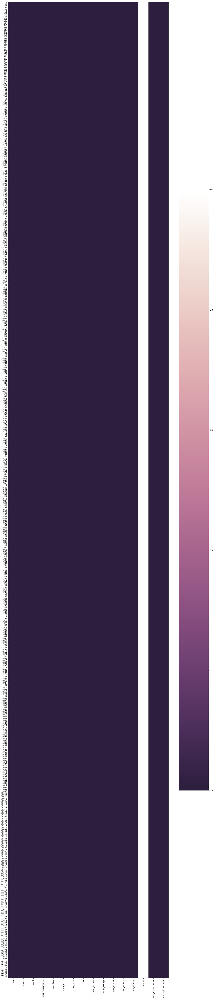

In [25]:
#Checking dataframe for missing data
%matplotlib inline
plt.figure(figsize=(20, 100))
colourmap = sns.cubehelix_palette(light=1, as_cmap=True, reverse=True)
sns.heatmap(df_irishdata.isnull(), cmap=colourmap)

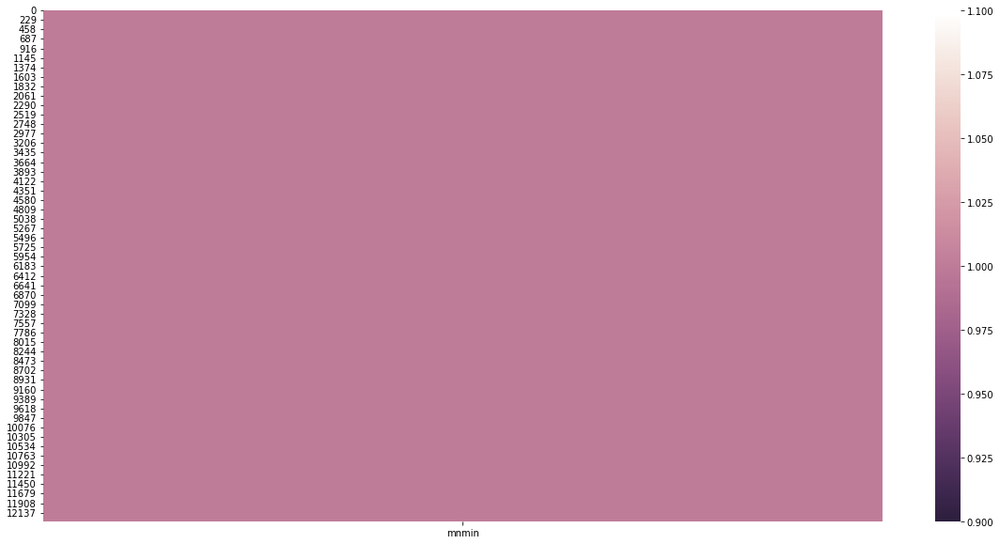

In [26]:
#To zoom in on the column crop-value
missing_data = df_irishdata.iloc[:, 13:14]
plt.figure(figsize=(20, 10))
colourmap = sns.cubehelix_palette(light=1, as_cmap=True, reverse=True)
sns.heatmap(missing_data.isnull(), cmap=colourmap)

In [27]:
# Remove column name 'mnmin'  There are too many missing values for imputation to be used
df_irishdata.drop(['mnmin'], axis = 1, inplace= True )

In [28]:

import plotly.express as px
fig = px.box(df_irishdata, y='crop_value')
fig.show()

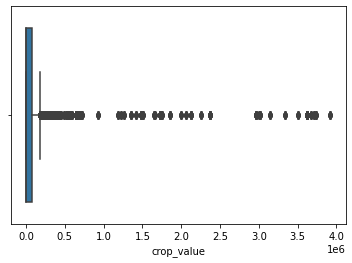

In [29]:
import seaborn as sns
#
# Box plot
#
sns.boxplot(df_irishdata.crop_value)


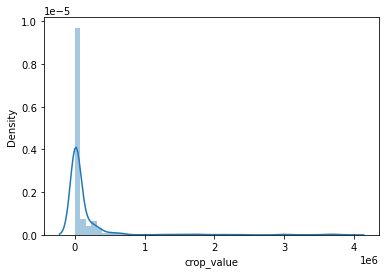

In [30]:
#
# Distribution plot
#
sns.distplot(df_irishdata.crop_value)

We can see from the above graph that the variable selling price is slightly right or postively skewed

In [31]:
##check rows where dependent variable is equal to zero
df_irishdata.loc[df_irishdata['crop_value']==0]

,Year,country,month,crop_measurement,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
540,2010,Ireland,January,tonnes,"Oil, coconut (copra)",Production,0.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5
541,2010,Ireland,February,tonnes,"Oil, coconut (copra)",Production,0.0,128.0,24,16,2.6,10.3,-6.1,-10,-1.3
542,2010,Ireland,March,tonnes,"Oil, coconut (copra)",Production,0.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2
543,2010,Ireland,April,tonnes,"Oil, coconut (copra)",Production,0.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0
544,2010,Ireland,May,tonnes,"Oil, coconut (copra)",Production,0.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12292,2020,Ireland,December,tonnes,Watermelons,Production,0.0,202.5,26,17,15.2,24.1,6.0,2.8,11.2
12293,2020,Ireland,February,tonnes,Watermelons,Production,0.0,135.2,25,18,12.6,21.0,-0.1,-1.6,8.6
12294,2020,Ireland,March,tonnes,Watermelons,Production,0.0,21.7,9,7,9.3,15.1,0.7,-0.7,5.9
12295,2020,Ireland,April,tonnes,Watermelons,Production,0.0,52.9,13,10,7.8,15.2,-0.7,-3.9,4.9


In [32]:
#We can see for the crop value column there are over 4613 rows with the value 0 I want to find the mean value of the column
print(df_irishdata['crop_value'].mean()) 

149249.4953422438


In [33]:
#For all rows with zero for the column crop_value replace them with the average value listed above 149249.4953422438
df_irishdata['crop_value'] = df_irishdata['crop_value'].replace(0, 149249.4953422438) 

In [34]:
#We have 2662 rows for the column crop_value that are null I am going to replace them too with the mean average value for that feature
# Replace NaNs in column crop_value with the
# mean of values in the same column
mean_value=df_irishdata['crop_value'].mean()
df_irishdata['crop_value'].fillna(value=mean_value, inplace=True)
print('Updated Dataframe:')
print(df_irishdata)

Updated Dataframe:
       Year  country     month crop_measurement crops_type    crops_action  \
0      2010  Ireland   January               ha     Apples  Area harvested   
1      2010  Ireland  February               ha     Apples  Area harvested   
2      2010  Ireland     March               ha     Apples  Area harvested   
3      2010  Ireland     April               ha     Apples  Area harvested   
4      2010  Ireland       May               ha     Apples  Area harvested   
...     ...      ...       ...              ...        ...             ...   
12340  2020  Ireland  December           tonnes      Wheat      Production   
12341  2020  Ireland  February           tonnes      Wheat      Production   
12342  2020  Ireland     March           tonnes      Wheat      Production   
12343  2020  Ireland     April           tonnes      Wheat      Production   
12344  2020  Ireland       May           tonnes      Wheat      Production   

       crop_value   rain  number_raindays  n

In [35]:
# check the sum of null records again it should be 0 this time for crop_value

df_irishdata.isnull().sum()

Year                   0
country                0
month                  0
crop_measurement       0
crops_type             0
crops_action           0
crop_value             0
rain                   0
number_raindays        0
number_wetdays         0
mean_airtemp           0
max_airtemp            0
min_airtemp            0
grass_minimumtemp      0
average_temperature    0
dtype: int64

# Imputation replacing the missing value with the mean value of each column/feature below:

In [36]:
# Replace NaNs in column crop_value with the
# mean of values in the same column
mean_value=df_irishdata['mean_airtemp'].mean()
df_irishdata['mean_airtemp'].fillna(value=mean_value, inplace=True)

In [37]:
mean_value=df_irishdata['max_airtemp'].mean()
df_irishdata['max_airtemp'].fillna(value=mean_value, inplace=True)

In [38]:

mean_value=df_irishdata['min_airtemp'].mean()
df_irishdata['min_airtemp'].fillna(value=mean_value, inplace=True)

In [39]:
mean_value=df_irishdata['average_temperature'].mean()
df_irishdata['average_temperature'].fillna(value=mean_value, inplace=True)
print('Updated Dataframe:')
print(df_irishdata)

Updated Dataframe:
       Year  country     month crop_measurement crops_type    crops_action  \
0      2010  Ireland   January               ha     Apples  Area harvested   
1      2010  Ireland  February               ha     Apples  Area harvested   
2      2010  Ireland     March               ha     Apples  Area harvested   
3      2010  Ireland     April               ha     Apples  Area harvested   
4      2010  Ireland       May               ha     Apples  Area harvested   
...     ...      ...       ...              ...        ...             ...   
12340  2020  Ireland  December           tonnes      Wheat      Production   
12341  2020  Ireland  February           tonnes      Wheat      Production   
12342  2020  Ireland     March           tonnes      Wheat      Production   
12343  2020  Ireland     April           tonnes      Wheat      Production   
12344  2020  Ireland       May           tonnes      Wheat      Production   

       crop_value   rain  number_raindays  n

In [40]:
#Convert grass_minumtemp which is an object to a float and then replace the missing values with the mean
df_irishdata['grass_minimumtemp'] = pd.to_numeric(df_irishdata['grass_minimumtemp'],errors='coerce')

In [41]:
#Now that grass_minimumtemp has been converted from a string to a float I have replaced the missing rows with the mean
mean_value=df_irishdata['grass_minimumtemp'].mean()
df_irishdata['grass_minimumtemp'].fillna(value=mean_value, inplace=True)

In [42]:
# check all columns for NAN values if any

df_irishdata.isna().any()

Year                   False
country                False
month                  False
crop_measurement       False
crops_type             False
crops_action           False
crop_value             False
rain                   False
number_raindays        False
number_wetdays         False
mean_airtemp           False
max_airtemp            False
min_airtemp            False
grass_minimumtemp      False
average_temperature    False
dtype: bool

# Descriptive Statistics for the Target feature: crop value

In [43]:
#inspect the dataframe for outliers will display the min,max mean and inner and outer quariles for all features
df_irishdata.describe()

,Year,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
count,12345.000000,1.234500e+04,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000
mean,2015.848765,1.814327e+05,124.603021,22.827380,18.195869,9.470871,18.014119,0.105978,-3.513427,5.748327
std,3.321685,4.830334e+05,56.473020,5.419035,5.232433,3.705427,4.966247,3.867283,4.760671,3.386088
min,2010.000000,1.000000e+00,20.200000,8.000000,6.000000,-0.400000,10.300000,-15.000000,-19.900000,-3.800000
25%,2013.000000,1.310000e+03,87.900000,20.000000,14.000000,6.100000,13.200000,-2.400000,-6.700000,3.100000
50%,2016.000000,5.798000e+04,112.800000,24.000000,18.000000,9.300000,17.200000,-0.500000,-3.500000,5.600000
75%,2019.000000,1.492495e+05,157.400000,27.000000,22.000000,12.700000,21.900000,3.300000,0.000000,8.800000
max,2020.000000,3.920000e+06,254.100000,31.000000,30.000000,17.300000,30.200000,9.500000,7.800000,12.500000


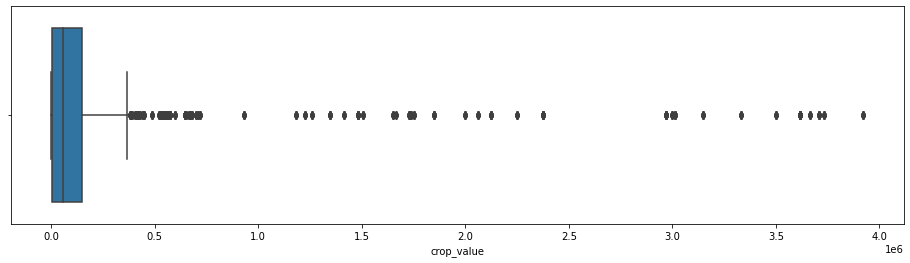

In [44]:
#boxplot for the target feature crop_value
plt.figure(figsize = (16,4))
sns.boxplot(x= df_irishdata['crop_value'])
plt.show()

In [45]:
#print the mean of the target feature
mean_cropvalue= df_irishdata['crop_value'].mean()
print(mean_cropvalue)

181432.7401053934


In [46]:
#print the median of the target feature
median = df_irishdata['crop_value'].median()
print(median)

57980.0


In [47]:
#print the mode of the target feature
mode = df_irishdata['crop_value'].mode()
print(mode)

0    149249.495342
dtype: float64


[Text(0, 0.5, 'Cropvalue'),
 Text(0.5, 0, 'Crop Price'),
 Text(0.5, 1.0, 'Cropvalue Histogram')]

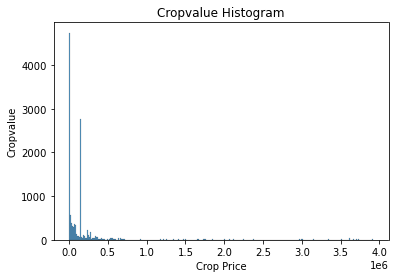

In [48]:
#histplot to display the distribution of crap _value
ax = sns.histplot(df_irishdata.crop_value)
ax.set(xlabel='Crop Price', ylabel='Cropvalue', title ='Cropvalue Histogram')

We can see from the above graph that the variable selling price is slightly right or postively skewed

Text(0.5, 1.0, 'Box plot Crop Value by Crop Action')

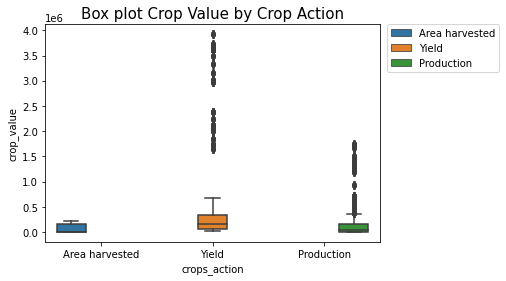

In [49]:
#Box plot to depict Box plot Crop Value by Crop Action
sns.boxplot(x = 'crops_action', y ='crop_value', data=df_irishdata, hue = 'crops_action')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Box plot Crop Value by Crop Action', fontsize=15)


In [ ]:
# Dropping the rows of all rows under crops action that do not contain Yield only is what I am intersested in 
df_irishdata= df_irishdata[df_irishdata["yield"].str.contains("Production|Area harvested") == False]
# display
df_irishdata

[Text(0, 0.5, 'Crop Price'),
 Text(0.5, 0, 'Crop Value'),
 Text(0.5, 1.0, 'Crop Prices Histogram')]

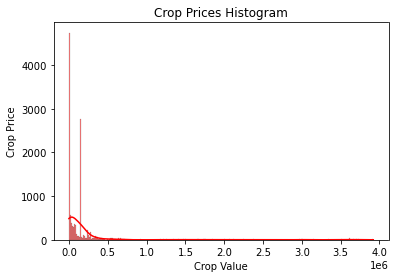

In [50]:
#histplot to display the distribution of crap _value in Red 
ax = sns.histplot(df_irishdata.crop_value, kde=True, color ='red')
ax.set(xlabel='Crop Value', ylabel='Crop Price', title ='Crop Prices Histogram')

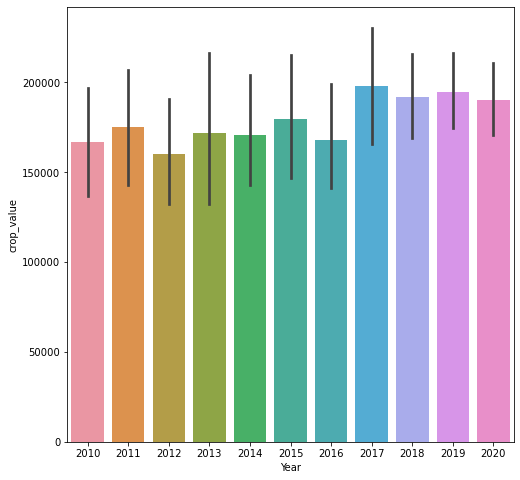

In [52]:
plt.figure(figsize=(8, 8))
ax = sns.barplot(x="Year", y="crop_value", data=df_irishdata)

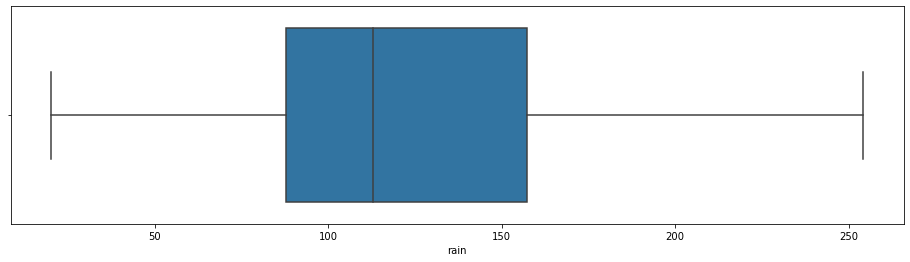

In [53]:
#boxplot for the feature rain
plt.figure(figsize = (16,4))
sns.boxplot(x= df_irishdata['rain'])
plt.show()

In [54]:
##check cardinality of all columns and the unique values for each

v_cardinality = df_irishdata.nunique()

print(v_cardinality)

Year                    11
country                  1
month                   12
crop_measurement         3
crops_type              63
crops_action             3
crop_value             640
rain                    88
number_raindays         20
number_wetdays          23
mean_airtemp            83
max_airtemp             86
min_airtemp             90
grass_minimumtemp       94
average_temperature     81
dtype: int64


Text(0.5, 1.0, 'Cardinality')

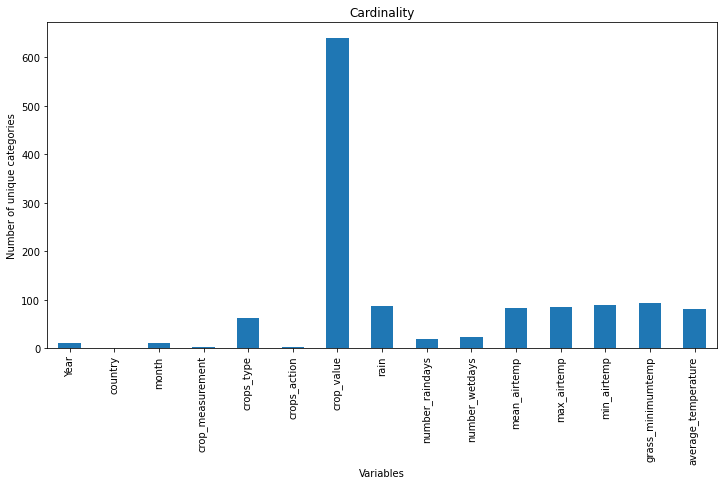

In [55]:
##plot cardinality using a barplot

df_irishdata.nunique().plot.bar(figsize=(12,6))

plt.ylabel('Number of unique categories')

plt.xlabel('Variables')

plt.title('Cardinality')

In [56]:
#checking the shape and size of the dataframe
print("Shape of the dataset is : ",df_irishdata.shape)
print("Size of the dataset is : ",df_irishdata.size)

Shape of the dataset is :  (12345, 15)
Size of the dataset is :  185175


In [57]:
#list the datatypes of all columns we can see there are alot of objects later I will change these to onehotencoding for the linear regression
df_irishdata.dtypes

Year                     int64
country                 object
month                   object
crop_measurement        object
crops_type              object
crops_action            object
crop_value             float64
rain                   float64
number_raindays          int64
number_wetdays           int64
mean_airtemp           float64
max_airtemp            float64
min_airtemp            float64
grass_minimumtemp      float64
average_temperature    float64
dtype: object

# Plot Distribution of the Target variable/feature crop_value

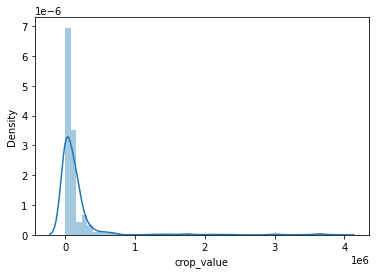

In [58]:
# plot distribution of crop_value target variable seaborn distplot
sns.distplot(df_irishdata['crop_value'])
plt.show()

The crop_value is not normally distributed the distribution is skewed left because it looks pulled out to the left

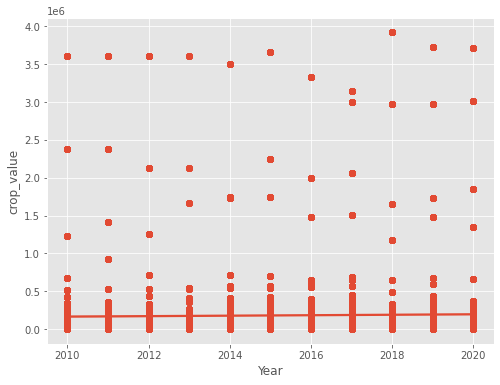

In [59]:
plt.style.use("ggplot")
plt.figure(figsize=(8,6))
sns.regplot(x = df_irishdata["Year"], y = df_irishdata["crop_value"])
plt.show()

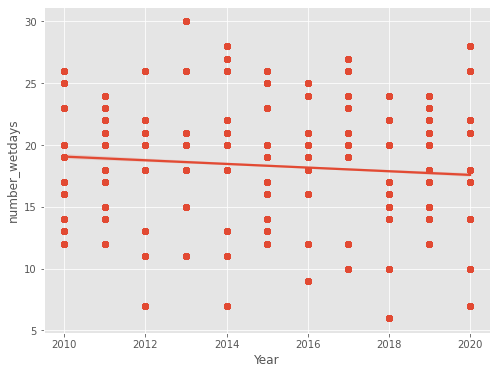

In [60]:
plt.style.use("ggplot")
plt.figure(figsize=(8,6))
sns.regplot(x = df_irishdata["Year"], y = df_irishdata["number_wetdays"])
plt.show()

# Exploratory Data Analysis

Let's take a look at the pearson correlation coefficients. This helps us understand the extent to which two variables are correlated. We will be able to see both the strength of the correlation as well as the direction and use that to make a decision on the exclusion of predictive variables that display multicollinearity.

In [61]:
# create correlation matrix displaying pearson correlation coefficients for all variables
corr_matrix = df_irishdata.corr()
corr_matrix

,Year,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
Year,1.000000,0.020883,-0.009834,-0.106061,-0.093977,0.050541,0.041924,0.028793,0.006261,0.063286
crop_value,0.020883,1.000000,0.001551,-0.001152,-0.000835,0.000979,0.000690,0.000037,-0.001031,0.001093
rain,-0.009834,0.001551,1.000000,0.745235,0.845314,0.341563,0.361331,0.308133,0.299374,0.301922
number_raindays,-0.106061,-0.001152,0.745235,1.000000,0.912496,0.329570,0.349133,0.299889,0.272384,0.300406
number_wetdays,-0.093977,-0.000835,0.845314,0.912496,1.000000,0.335261,0.337909,0.322497,0.322835,0.310191
mean_airtemp,0.050541,0.000979,0.341563,0.329570,0.335261,1.000000,0.911631,0.915962,0.789203,0.982389
max_airtemp,0.041924,0.000690,0.361331,0.349133,0.337909,0.911631,1.000000,0.777944,0.637355,0.845758
min_airtemp,0.028793,0.000037,0.308133,0.299889,0.322497,0.915962,0.777944,1.000000,0.861039,0.934275
grass_minimumtemp,0.006261,-0.001031,0.299374,0.272384,0.322835,0.789203,0.637355,0.861039,1.000000,0.824640
average_temperature,0.063286,0.001093,0.301922,0.300406,0.310191,0.982389,0.845758,0.934275,0.824640,1.000000


We can also visually examine the relationships between the measurable variables via a scatterplot using a randomly selected sample size of 1,000. We also see the histograms for each of the measurable variables displayed across the diagonal.

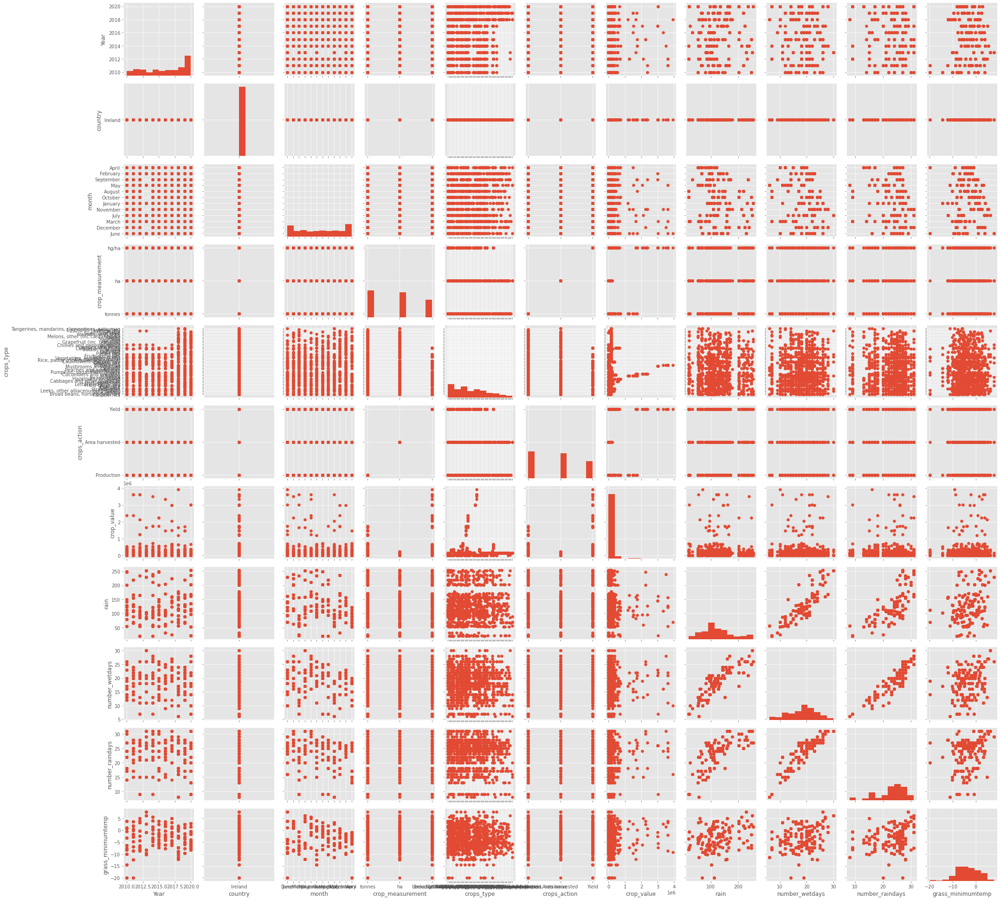

In [62]:
# plot pair grid with histograms and scatterplots using seaborn pairgrid
irish_data_sample = df_irishdata.sample(1000)
p = sns.PairGrid(data=irish_data_sample, vars=["Year","country","month","crop_measurement","crops_type","crops_action","crop_value","rain","number_wetdays","number_raindays","grass_minimumtemp"])
p.map_diag(plt.hist)
p.map_offdiag(plt.scatter)

We can observe a roughly normal distribution for available_bike_stands.  A decision will need to be made as to which should be used when we create the linear regression model. crops_type will be the Target variable

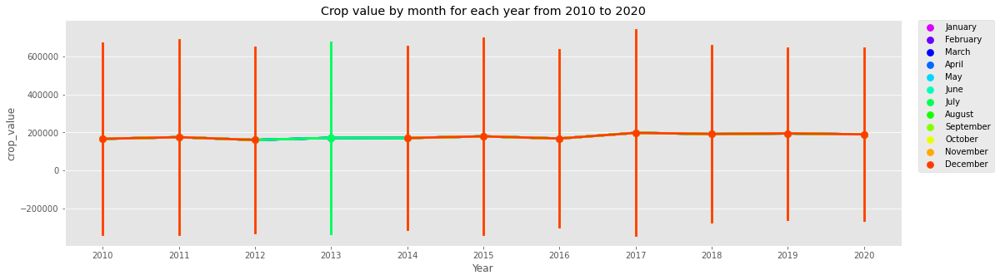

In [63]:
# create point plot using seaborn pointplot to display Crop Value by month for each year from 2010 to 2020
fig,(ax1)= plt.subplots(nrows=1)
fig.set_size_inches(18,5)
sns.pointplot(data= df_irishdata, x='Year', y='crop_value', ci="sd", hue='month', palette='gist_rainbow_r')
ax1.set(title='Crop value by month for each year from 2010 to 2020')
#place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

we can see a sharp increase from 2017 and again in 2020 and overall 2020 was the highest year for crops value.  The best month was July in 2013

[Text(0.5, 1.0, 'Crop Value and the type of crop action for each year from 2010 to 2020')]

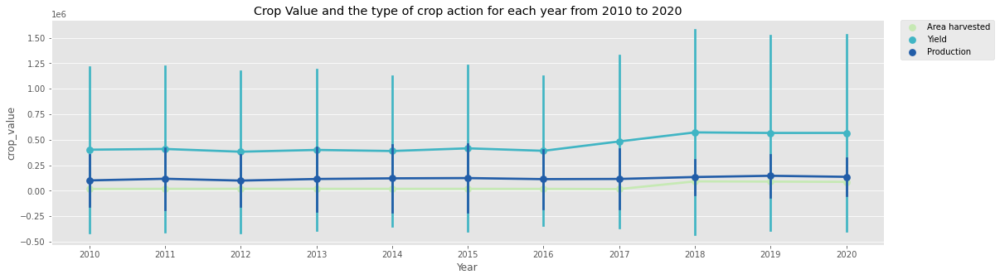

In [64]:
# create point plot comparing Crop Value and the type of crop action for each year from 2010 to 2020 using seaborn pointplot
fig,(ax1)= plt.subplots(nrows=1)
fig.set_size_inches(18,5)
sns.pointplot(data= df_irishdata, x='Year', y='crop_value', ci="sd", hue='crops_action', palette='YlGnBu')
#place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
ax1.set(title='Crop Value and the type of crop action for each year from 2010 to 2020')

We can see from the seaborn subplot that it is 2020 was the year the crop value was the highest but really it did not change that much year on year over the decade. It is depicted though that stocks increased significantly from 2017 to 2020

[Text(0.5, 1.0, 'Count of the type of crops and value for each year from 2010 to 2020')]

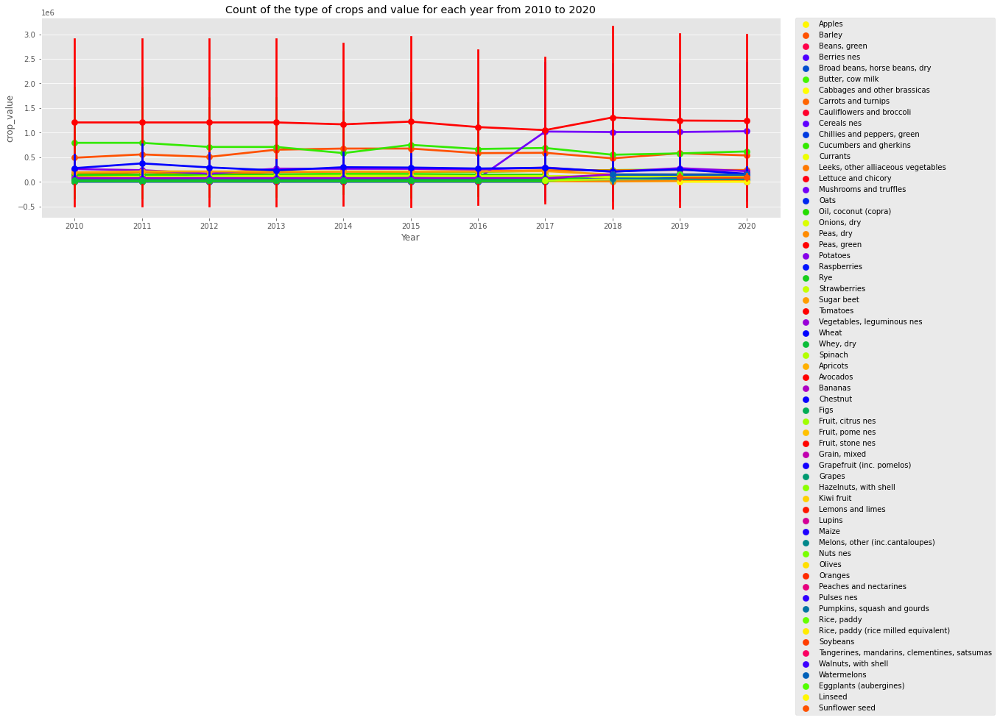

In [65]:
# create point plot Count of the type of crops and value for each year from 2010 to 2020 using seaborn pointplot
fig,(ax1)= plt.subplots(nrows=1)
fig.set_size_inches(18,5)
sns.pointplot(data= df_irishdata, x='Year', y='crop_value', ci="sd", hue='crops_type', palette='prism_r')
#place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
ax1.set(title='Count of the type of crops and value for each year from 2010 to 2020')

Barley was the most sold over the decade in 2018 the highest amount crop value

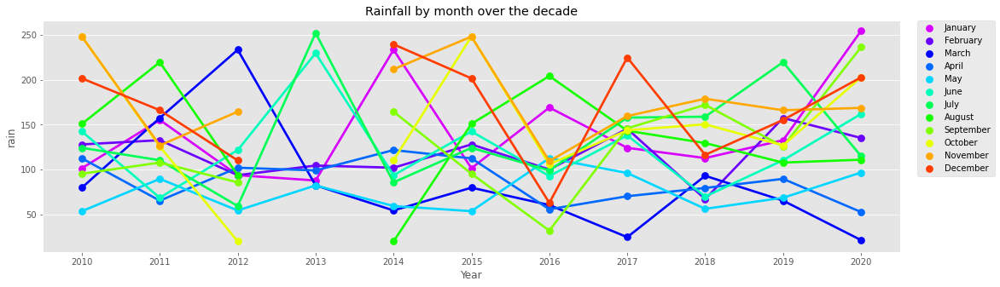

In [66]:
# create point plot comparing Rainfall by month over the decade using seaborn pointplot
fig,(ax1)= plt.subplots(nrows=1)
fig.set_size_inches(18,5)
sns.pointplot(data= df_irishdata, x='Year', y='rain', ci="sd", hue='month', palette='gist_rainbow_r')
ax1.set(title='Rainfall by month over the decade')
#place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

We can see over the decade we had the highest rainfall in January 2020 and the lowest in October 2012

[Text(0.5, 1.0, 'Crop value by crop action for each year over the decade')]

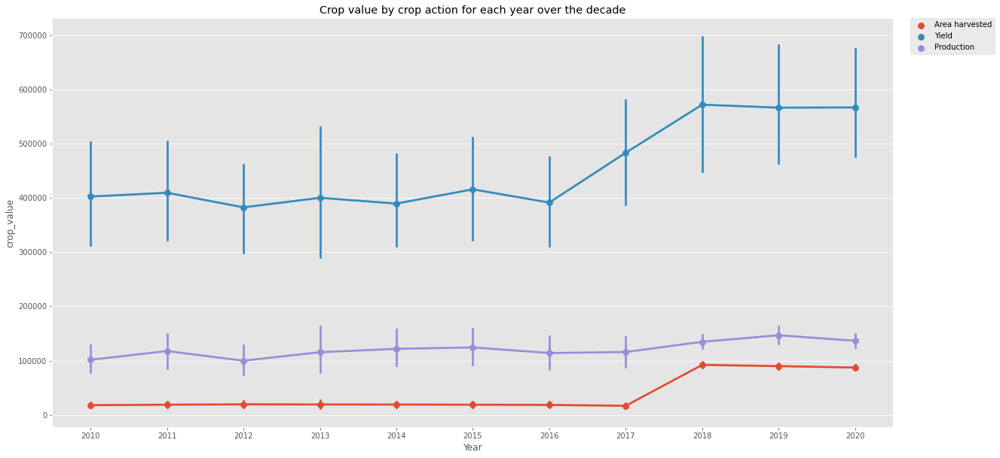

In [68]:
#Crop value by crop action for each year over the decade using seaborn pointplot

fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df_irishdata, x='Year', y='crop_value', hue='crops_action', ax=ax)
#place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
ax.set(title='Crop value by crop action for each year over the decade')

The highest crop yield was in 2018 the lowest was in 2013.  2012 was the highest production of crops and 2018 was slighty the highest year for crop area harvested.

[Text(0.5, 1.0, 'Grass minimum temperature by month throughout the decade')]

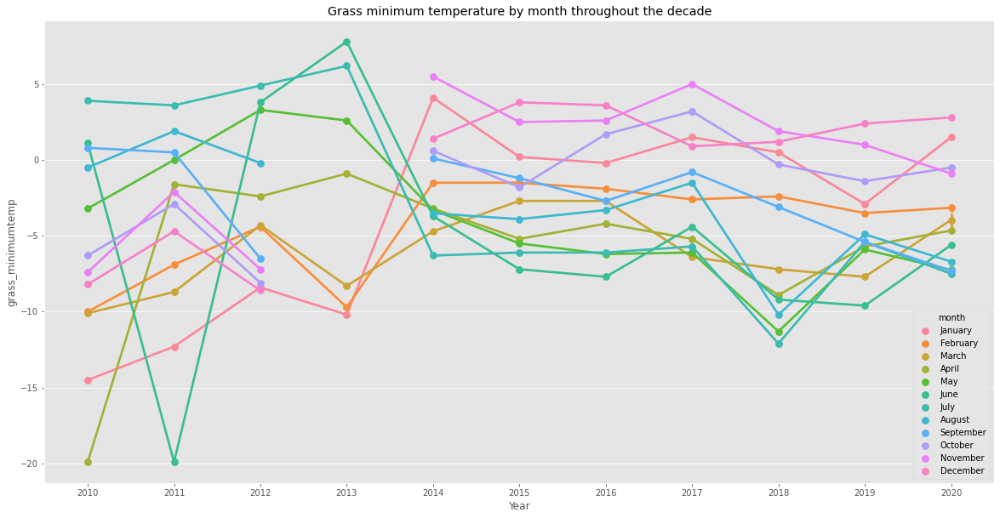

In [69]:
#Greatest rd = rainfall by month throughout the decade using seaborn pointplot
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df_irishdata, x='Year', y='grass_minimumtemp', hue='month', ax=ax)
ax.set(title='Grass minimum temperature by month throughout the decade')

June 2013 was the year and month with the highest grass temperature.  April 2010 was the lowest.

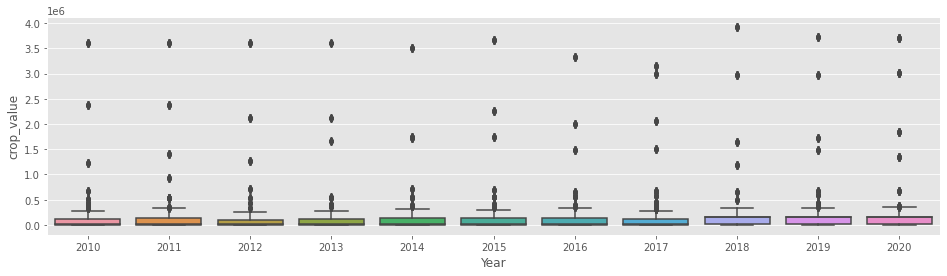

In [70]:
#Box plot visualisation to depict the crop price from 2010 to 2020
plt.figure(figsize = (16,4))
sns.boxplot(x='Year', y='crop_value',data=df_irishdata)
plt.show()

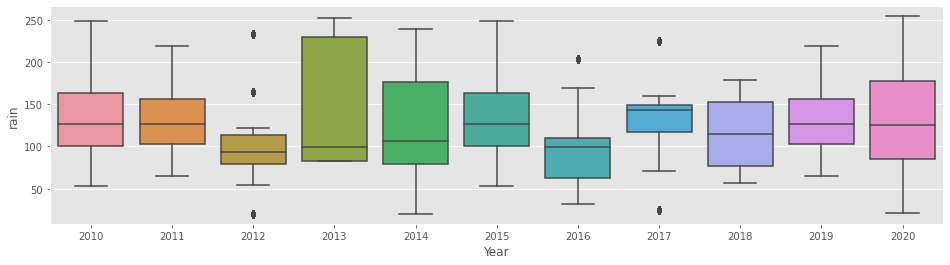

In [71]:
#Box plot visualisation to depict the rain for each year
plt.figure(figsize = (16,4))
sns.boxplot(x='Year', y='rain',data=df_irishdata)
plt.show()

In [72]:
#using plotly express display a barplot for the crop value for each year
import plotly.express as px

fig = px.bar(df_irishdata, x='Year', y='crop_value',)
fig.show()

In [73]:
#plotly bar plot to display number of wet days
import plotly.express as px

fig = px.bar(df_irishdata, x='Year', y='number_wetdays')
fig.show()

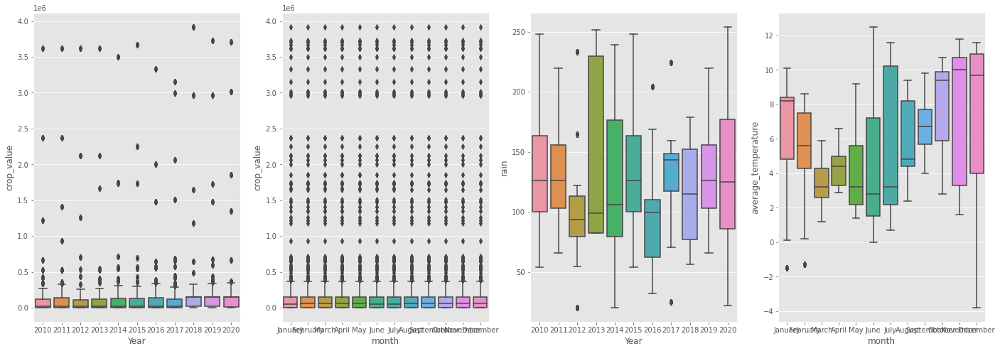

In [74]:
# create box plots for time related variables using seaborn boxplot
figure, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4)
figure.set_size_inches(24, 8)

sns.boxplot(data=df_irishdata, x='Year', y='crop_value', ax=ax1)
sns.boxplot(data=df_irishdata, x='month', y='crop_value', ax=ax2)
sns.boxplot(data=df_irishdata, x='Year', y='rain', ax=ax3)
sns.boxplot(data=df_irishdata, x='month', y='average_temperature', ax=ax4)

[Text(0.5, 1.0, 'Count of crop value for each year over the decade')]

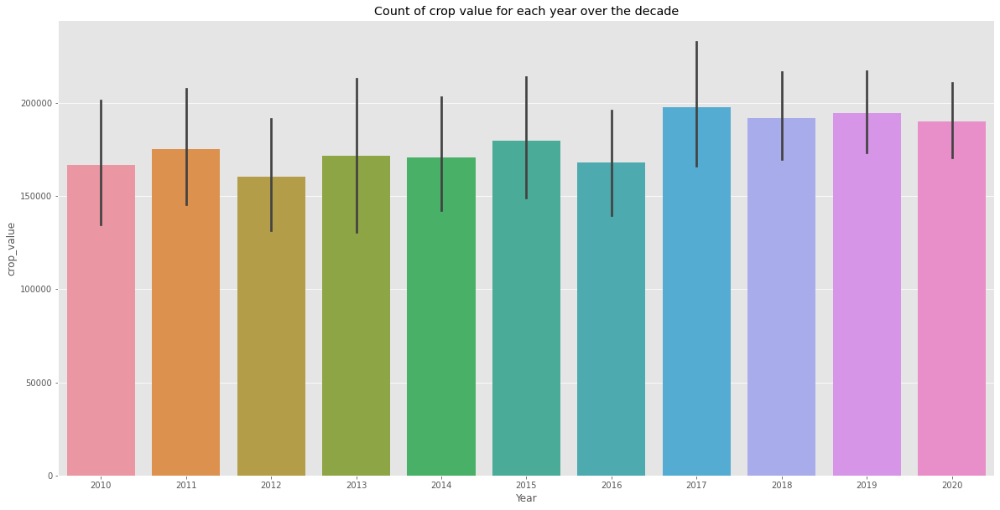

In [75]:
#Barplot to display count of crop value over each year using seaborn barplot
fig, ax = plt.subplots(figsize=(20,10))
sns.barplot(data=df_irishdata, x='Year', y='crop_value', ax=ax)
ax.set(title='Count of crop value for each year over the decade')

[Text(0.5, 1.0, 'Count of average temperature for each year over the decade')]

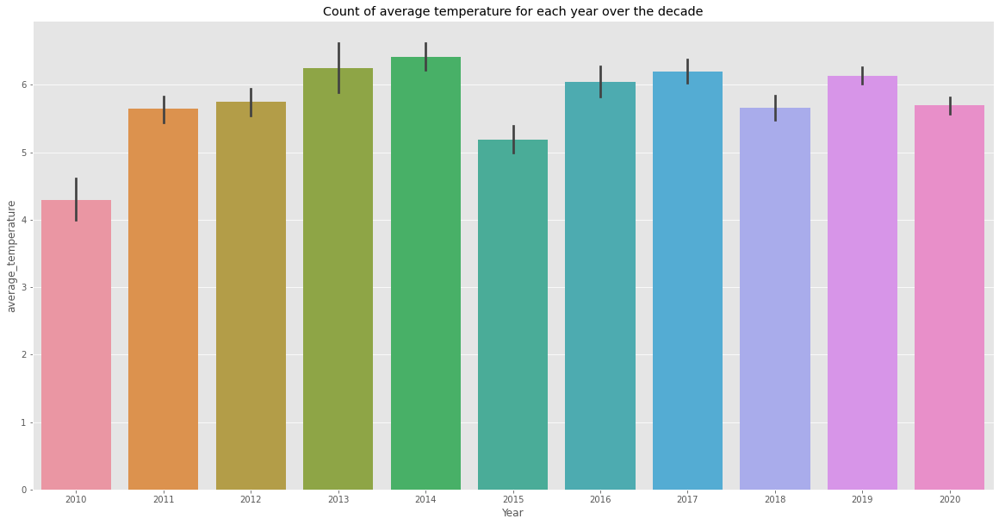

In [77]:
#Barplot to display count of average temp each year over the decade using seaborn barplot
fig, ax = plt.subplots(figsize=(20,10))
sns.barplot(data=df_irishdata, x='Year', y='average_temperature', ax=ax)
ax.set(title='Count of average temperature for each year over the decade')

[Text(0.5, 1.0, 'Relation between year and crop value')]

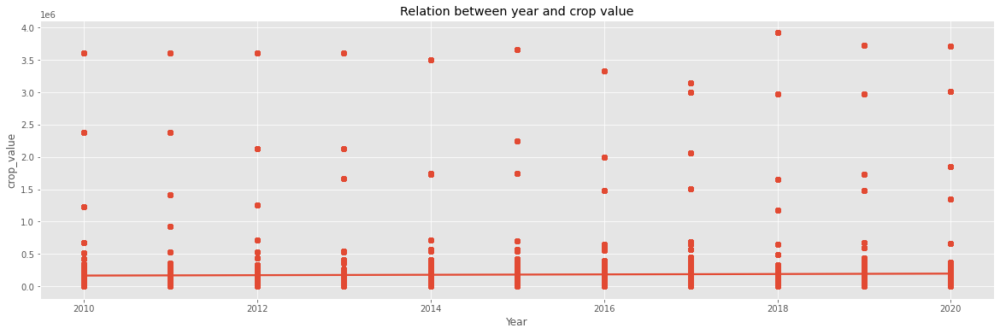

In [78]:
#seaborn regplot used to display the relationship between Relation between year and crop value
fig, (ax1) = plt.subplots(ncols=1, figsize=(20,6))
sns.regplot(x=df_irishdata['Year'], y=df_irishdata['crop_value'], ax=ax1)
ax1.set(title="Relation between year and crop value")


[Text(0.5, 1.0, 'Theoritical quantiles')]

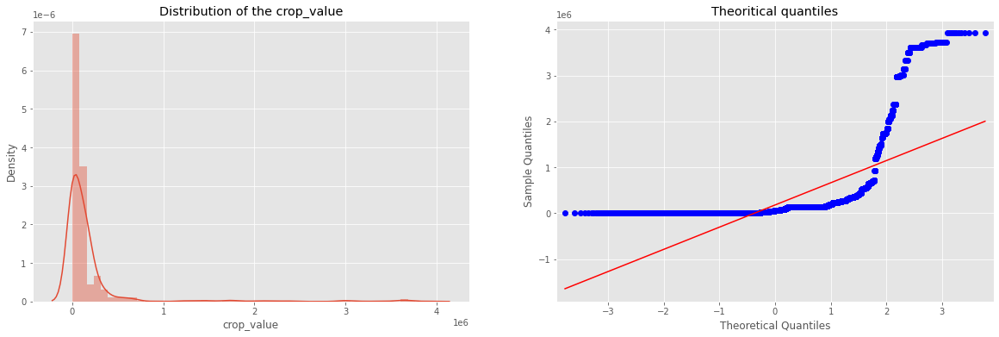

In [79]:
# seaborn distplot used to depict the distribution of cropvalue and the Theoritical quantiles of that feature
from statsmodels.graphics.gofplots import qqplot
fig, (ax1,ax2) = plt.subplots(ncols=2, figsize=(20,6))
sns.distplot(df_irishdata['crop_value'], ax=ax1)
ax1.set(title='Distribution of the crop_value')
qqplot(df_irishdata['crop_value'], ax=ax2, line='s')
ax2.set(title='Theoritical quantiles')

[Text(0.5, 1.0, 'Theoritical quantiles')]

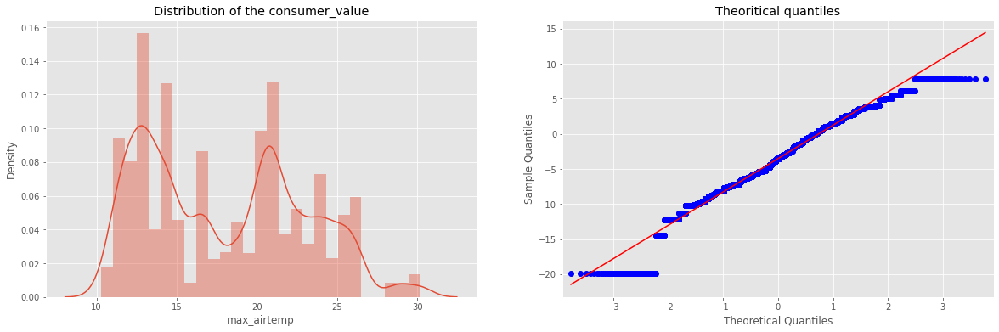

In [80]:
# seaborn distplot used to depict the distribution of max_airtemp and the Theoritical quantiles of grass_minimumtemp
from statsmodels.graphics.gofplots import qqplot
fig, (ax1,ax2) = plt.subplots(ncols=2, figsize=(20,6))
sns.distplot(df_irishdata['max_airtemp'], ax=ax1)
ax1.set(title='Distribution of the consumer_value')
qqplot(df_irishdata['grass_minimumtemp'], ax=ax2, line='s')
ax2.set(title='Theoritical quantiles')

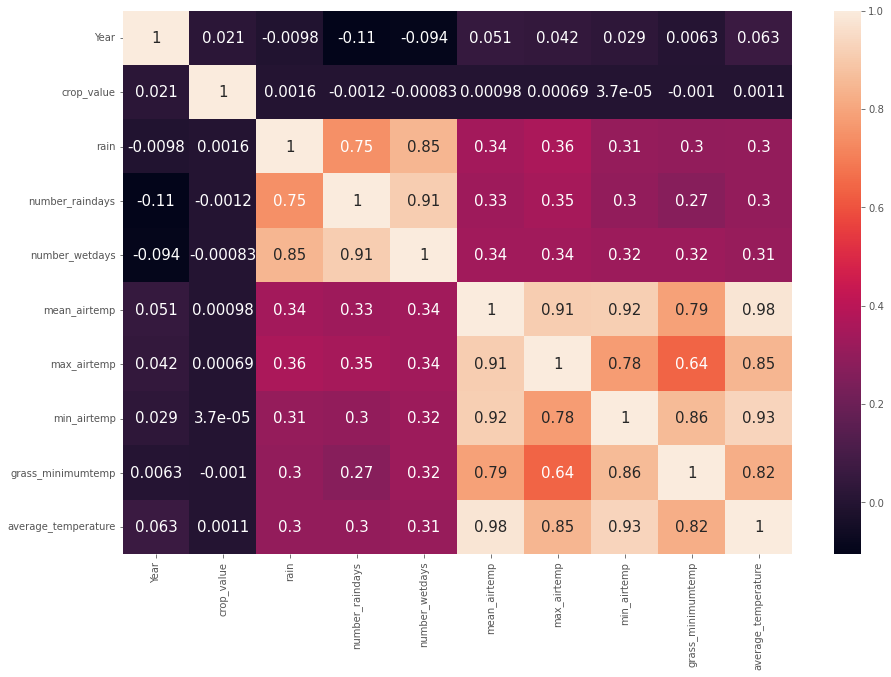

In [81]:
#Coorelation Matrix to compare the relationships and correlation between features
corr = df_irishdata.corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot=True, annot_kws={'size':15})

-1 indicates a perfectly negative linear correlation between two variables.
0 indicates no linear correlation between two variables.
1 indicates a perfectly positive linear correlation between two variables

We can see that Year and Average Temperature have a Perfectly Positive Linear Correlation between both features.
0.75 Rain and Number of Wetdays are correlated. 
0.64 Max airtemp and grass minimum temp are correlated.
0.79 grass_minimumtemp and mean/average airtemp are correlated.
0.86 grass_minimumtemp and minimum airtemp are correlated.

The target Crop_value we can see already does not have any correlation with any other feature :(

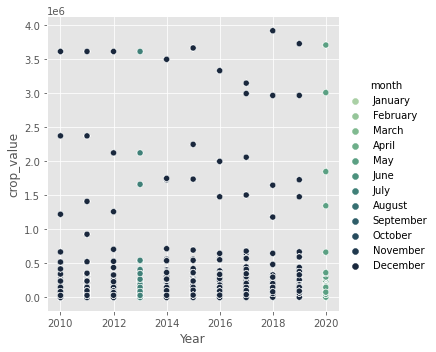

In [82]:
#using a seaborn relplot to plot 3 data points to see the relationship between 2 variables using my own color pallete hue is hour time of day
sns.relplot(x="Year", y="crop_value", hue="month", palette="ch:r=-.5,l=.75", data=df_irishdata);

In [86]:
#create two arrays to compare coefficients for the 2 highest correlated features
cropgrasstemp=np.array(df_irishdata["grass_minimumtemp"])
cropairtemp=np.array(df_irishdata["min_airtemp"])

In [87]:
#how to work out coefficients between gdp and 
np.corrcoef (cropgrasstemp, cropairtemp)

array([[1.        , 0.86103913],
       [0.86103913, 1.        ]])

Again we can see how highly correlated both features are now lets plot them below in an interactive visualisation

# The result tells us that there is a high correlation between grass_minimumtemp and min_airtemp

# Interactive Visualisation using Plotly

In [96]:
import plotly.express as px

In [97]:
#Were creating two variables for our min and max values for the slider
xmin,xmax=min(df_irishdata["Year"]), max(df_irishdata["Year"])
ymin,ymax=min(df_irishdata["crop_value"]), max(df_irishdata["crop_value"])

In [98]:
#Using year as the animation frame, and as we go through each year the values will change want to group it by month
#The color will be the crops type each crop will have a different color, using hover for the year to give us info
#Split up the sections by usi by crops Action (yield, Harvest and Productions) 

fig= px.scatter(df_irishdata, x="Year", y="crop_value", animation_frame ="Year",
               animation_group="month",color="crops_type", hover_name="month", 
               facet_col="crops_action", width=1580, height=400, log_x=True, size_max=10000,
               range_x=[xmin,xmax],range_y=[ymin,ymax])
               

In [99]:
fig.show()

In [101]:
#Using plotly to display barchart Value of crops produced by Ireland each year crops type action and month displayed
import plotly.express as px

fig = px.bar(df_irishdata, x='Year', y='crop_value',
                hover_data=['crops_type','month'], color='crops_action',
                labels={'country':'Value of crops produced by Ireland each year'}, height=400, title='Value of crops produced by Ireland each year')

fig.show()

In [102]:
df_irishdata.head()

,Year,country,month,crop_measurement,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
0,2010,Ireland,January,ha,Apples,Area harvested,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5
1,2010,Ireland,February,ha,Apples,Area harvested,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3
2,2010,Ireland,March,ha,Apples,Area harvested,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2
3,2010,Ireland,April,ha,Apples,Area harvested,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0
4,2010,Ireland,May,ha,Apples,Area harvested,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6


In [103]:
#Checking the crops present
df_irishdata['crops_type'].value_counts()

Raspberries                             393
Strawberries                            393
Potatoes                                393
Peas, dry                               393
Lettuce and chicory                     393
                                       ... 
Oranges                                  80
Rice, paddy (rice milled equivalent)     40
Soybeans                                 40
Linseed                                  28
Eggplants (aubergines)                   24
Name: crops_type, Length: 63, dtype: int64

# Descriptive Statistics

Getting the mean of all of our Climate features

In [107]:
#Checking average climatic and soil requirements

print(" Average Ratio of grass_temp in the Soil : {0:.2f}".format(df_irishdata['grass_minimumtemp'].mean()))
print(" Average Ratio of Rain in the Soil : {0:.2f}".format(df_irishdata['rain'].mean()))
print(" Average Ratio of average_temperature in the Soil : {0:.2f}".format(df_irishdata['average_temperature'].mean()))
print(" Average max_airtemp in Celsius : {0:.2f}".format(df_irishdata['max_airtemp'].mean()))
print(" Average Relative min_airtemp in % : {0:.2f}".format(df_irishdata['min_airtemp'].mean()))
print(" Average number_wetdays : {0:.2f}".format(df_irishdata['number_wetdays'].mean()))
print(" Average number_raindays : {0:.2f}".format(df_irishdata['number_raindays'].mean()))

 Average Ratio of grass_temp in the Soil : -3.51
 Average Ratio of Rain in the Soil : 124.60
 Average Ratio of average_temperature in the Soil : 5.75
 Average max_airtemp in Celsius : 18.01
 Average Relative min_airtemp in % : 0.11
 Average number_wetdays : 18.20
 Average number_raindays : 22.83


Now that I have finished with my visualisations above, I want to tidy up my crops_type column which include produce and livestock animals.  So I will remove the stings I do not want to focus on Crops only.  Otherwise I would have meaningless data such as the grass temperature for goats and chickens.

In [112]:
#Checking the detailed descriptive statistics for each crop 
#Creating a list of all  crops and then can use descriptive stats to get the mean, meadian and mode 
#(min, mean and max of each climate factors for each of the crops using interact.
                                                                                                      
@interact
def summary(crops = list(df_irishdata['crops_type'].value_counts().index)):
    x = df_irishdata[df_irishdata['crops_type'] == crops]
    print("...........................................")
    print("Statistics for Grass Temp")
    print("Minimum Grass_temp required:", x['grass_minimumtemp'].min())
    print("Average Grass_temp required:", x['grass_minimumtemp'].mean())
    print("Maximum Grass_temp required:", x['grass_minimumtemp'].max())
    print("...........................................")
    print("Statistics for Rain")
    print("Minimum Rain required:", x['rain'].min())
    print("Average Rain required:", x['rain'].mean())
    print("Maximum Rain required:", x['rain'].max())
    print("...........................................")
    print("Statistics for Average Temperature")
    print("Minimum average_temperature required:", x['average_temperature'].min())
    print("Average average_temperature:", x['average_temperature'].mean())
    print("Maximum average_temperature:", x['average_temperature'].max())
    print("...........................................")
    print("Statistics for Air Temperature")
    print("Minimum Temperature required: {0:.2f}".format(x['max_airtemp'].min()))
    print("Average Temperature required: {0:.2f}".format(x['max_airtemp'].mean()))
    print("Maximum Temperature required: {0:.2f}".format(x['max_airtemp'].max()))
    print("...........................................")
    print("Statistics for Minimum AirTemp")
    print("Minimum min_airtemp required: {0:.2f}".format(x['min_airtemp'].min()))
    print("Average min_airtemp required: {0:.2f}".format(x['min_airtemp'].mean()))
    print("Maximum min_airtemprequired: {0:.2f}".format(x['min_airtemp'].max()))
    print("...........................................")
    print("Statistics for Number of Wetdays")
    print("Minimum number_wetdays required: {0:.2f}".format(x['number_wetdays'].min()))
    print("Average number_wetdaysrequired: {0:.2f}".format(x['number_wetdays'].mean()))
    print("Maximum number_wetdays required: {0:.2f}".format(x['number_wetdays'].max()))
    print("...........................................")
    print("Statistics for Number of Rainy Days")
    print("Minimum number_raindays required: {0:.2f}".format(x['number_raindays'].min()))
    print("Average number_raindays required: {0:.2f}".format(x['number_raindays'].mean()))
    print("Maximum number_raindays required: {0:.2f}".format(x['number_raindays'].max()))

interactive(children=(Dropdown(description='crops', options=('Raspberries', 'Strawberries', 'Potatoes', 'Peas,…

Comparing and getting the perfect climate conditions for each individual crop by using the dropdown

In [113]:
#Comparing Average requirement and conditions for each crop

@interact
def compare(climateconditions = ['grass_minimumtemp', 'rain', 'average_temperature', 'max_airtemp', 'min_airtemp', 'number_wetdays', 'number_raindays']):
    print("Average Value for", climateconditions, "is {0:.2f}".format(df_irishdata[climateconditions].mean()))
    print("...........................................")
    print("Apples : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Apples')][climateconditions].mean()))
    print("Apricots : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Apricots')][climateconditions].mean()))
    print("Avocados : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Avocados')][climateconditions].mean()))
    print("Bananas : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Bananas')][climateconditions].mean()))
    print("Barley : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Barley')][climateconditions].mean()))
    print("Beans, green : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Beans, green')][climateconditions].mean()))
    print("Berries nes : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Berries nes')][climateconditions].mean()))
    print("Broad beans, horse beans, dry : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Broad beans, horse beans, dry')][climateconditions].mean()))
    print("Cabbages and other brassicas : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Cabbages and other brassicas')][climateconditions].mean()))
    print("Carrots and turnips : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Carrots and turnips')][climateconditions].mean()))
    print("Cauliflowers and broccoli : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Cauliflowers and broccoli')][climateconditions].mean()))
    print("Cereals nes : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Cereals nes')][climateconditions].mean()))
    print("Chestnut : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Chestnut')][climateconditions].mean()))
    print("Chillies and peppers, green : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Chillies and peppers, green')][climateconditions].mean()))
    print("Cucumbers and gherkins : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Cucumbers and gherkins')][climateconditions].mean()))
    print("Currants : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Currants')][climateconditions].mean()))
    print("Figs : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Figs')][climateconditions].mean()))
    print("Lettuce and chicory : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Lettuce and chicory')][climateconditions].mean()))
    print("Linseed : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Linseed')][climateconditions].mean()))
    print("Mushrooms and truffles : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Mushrooms and truffles')][climateconditions].mean()))
    print("Wheat : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Wheat')][climateconditions].mean()))
    print("Vegetables, leguminous nes : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Vegetables, leguminous nes')][climateconditions].mean()))
    print("Tomatoes : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Tomatoes')][climateconditions].mean()))
    print("Sugar beet : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Sugar beet')][climateconditions].mean()))
    print("Strawberries : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Strawberries')][climateconditions].mean()))
    print("Spinach : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Spinach')][climateconditions].mean()))
    print("Rye : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Rye')][climateconditions].mean()))
    print("Raspberries : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Raspberries')][climateconditions].mean()))
    
    print("Pumpkins, squash and gourds : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Pumpkins, squash and gourds')][climateconditions].mean()))
    print("Potatoes : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Potatoes')][climateconditions].mean()))
    print("Peas, green : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Peas, green')][climateconditions].mean()))
    print("Peas, dry : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Peas, dry')][climateconditions].mean()))
    print("Onions, dry : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Onions, dry')][climateconditions].mean()))
    print("Oats : {0:.2f}".format(df_irishdata[(df_irishdata['crops_type'] == 'Oats')][climateconditions].mean()))
    
    

interactive(children=(Dropdown(description='climateconditions', options=('grass_minimumtemp', 'rain', 'average…

In [114]:
#Checking the below and above Average Conditions for each crop

@interact
def compare(climateconditions = ['grass_minimumtemp', 'rain', 'average_temperature', 'max_airtemp', 'min_airtemp', 'number_wetdays', 'number_raindays']):
    print("Crops that require greater than average", climateconditions, '\n')
    print(df_irishdata[df_irishdata[climateconditions] > df_irishdata[climateconditions].mean()]['crops_type'].unique())
    print("...........................................")
    print("Crops that require less than average", climateconditions, '\n')
    print(df_irishdata[df_irishdata[climateconditions] <= df_irishdata[climateconditions].mean()]['crops_type'].unique())

interactive(children=(Dropdown(description='climateconditions', options=('grass_minimumtemp', 'rain', 'average…

Checking the distributiion for each climate weather condition

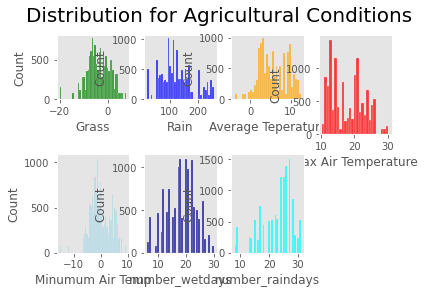

In [115]:
#Checking the distributiion for each climate weather condition

plt.subplot(3,4,1)
sns.histplot(df_irishdata['grass_minimumtemp'], color="green")
plt.xlabel('Grass', fontsize = 12)
plt.grid()

plt.subplot(3,4,2)
sns.histplot(df_irishdata['rain'], color="blue")
plt.xlabel('Rain', fontsize = 12)
plt.grid()

plt.subplot(3,4,3)
sns.histplot(df_irishdata['average_temperature'], color="orange")
plt.xlabel('Average Teperature', fontsize = 12)
plt.grid()

plt.subplot(2,4,4)
sns.histplot(df_irishdata['max_airtemp'], color="red")
plt.xlabel('Max Air Temperature', fontsize = 12)
plt.grid()

plt.subplot(2,4,5)
sns.histplot(df_irishdata['min_airtemp'], color="lightblue")
plt.xlabel('Minumum Air Temp', fontsize = 12)
plt.grid()

plt.subplot(2,4,6)
sns.histplot(df_irishdata['number_wetdays'], color="darkblue")
plt.xlabel('number_wetdays', fontsize = 12)
plt.grid()

plt.subplot(2,4,7)
sns.histplot(df_irishdata['number_raindays'], color="cyan")
plt.xlabel('number_raindays', fontsize = 12)
plt.grid()

plt.suptitle('Distribution for Agricultural Conditions', fontsize = 20)
plt.show()

Entering in conditional and bitwise operations to find out crops with unusual requirements

In [117]:
#Checking that crops those have unusual requirements

print("Some Interesting Patterns")
print("...........................................")
print("Crops that require very High Ratio of Grass Minuimum Temp of Soil:", df_irishdata[df_irishdata['grass_minimumtemp'] > 7]['crops_type'].unique())
print("Crops that require very High Ratio of Rainfall:", df_irishdata[df_irishdata['rain'] > 254]['crops_type'].unique())
print("Crops that require very High Ratio of Average Temperature:", df_irishdata[df_irishdata['average_temperature'] > 12]['crops_type'].unique())
print("Crops that require very High Air Temperature:", df_irishdata[df_irishdata['max_airtemp'] > 30]['crops_type'].unique())
print("Crops that require very Low Air Temperature:", df_irishdata[df_irishdata['min_airtemp'] < 10]['crops_type'].unique())
print("Crops that require number_wetdays:", df_irishdata[df_irishdata['number_wetdays'] > 10]['crops_type'].unique())
print("Crops that require number_raindays:", df_irishdata[df_irishdata['number_raindays'] < 10]['crops_type'].unique())
print("Crops that require very Low Air Temp:", df_irishdata[df_irishdata['min_airtemp'] <5]['crops_type'].unique())
print("Crops that require very High Air:", df_irishdata[df_irishdata['max_airtemp'] >30]['crops_type'].unique())

Some Interesting Patterns
...........................................
Crops that require very High Ratio of Grass Minuimum Temp of Soil: ['Apples' 'Barley' 'Beans, green' 'Berries nes'
 'Broad beans, horse beans, dry' 'Butter, cow milk'
 'Cabbages and other brassicas' 'Carrots and turnips'
 'Cauliflowers and broccoli' 'Cereals nes' 'Chillies and peppers, green'
 'Cucumbers and gherkins' 'Currants' 'Leeks, other alliaceous vegetables'
 'Lettuce and chicory' 'Mushrooms and truffles' 'Oats'
 'Oil, coconut (copra)' 'Onions, dry' 'Peas, dry' 'Peas, green' 'Potatoes'
 'Raspberries' 'Rye' 'Strawberries' 'Sugar beet' 'Tomatoes'
 'Vegetables, leguminous nes' 'Wheat' 'Whey, dry']
Crops that require very High Ratio of Rainfall: ['Apples' 'Apricots' 'Avocados' 'Bananas' 'Barley'
 'Broad beans, horse beans, dry' 'Cabbages and other brassicas'
 'Carrots and turnips' 'Cauliflowers and broccoli' 'Cereals nes'
 'Chestnut' 'Cucumbers and gherkins' 'Currants' 'Figs' 'Fruit, citrus nes'
 'Fruit, pome nes'

Using conditional statements and breaking the airtemp up into 3 seasons summer, winter and monsoon rain and listing
the crops that fall under each season

In [119]:
#Checking which crop to be grown according to the season

print("Summer Crops")
print(df_irishdata[(df_irishdata['max_airtemp'] >28) & (df_irishdata['grass_minimumtemp'] >3)]['crops_type'].unique())
print("...........................................")
print("Winter Crops")
print(df_irishdata[(df_irishdata['max_airtemp'] < 11) & (df_irishdata['min_airtemp'] <-5)]['crops_type'].unique())
print("...........................................")
print("Monsoon Crops")
print(df_irishdata[(df_irishdata['number_raindays'] > 30) & (df_irishdata['number_raindays'] < 300)]['crops_type'].unique())

Summer Crops
['Apples' 'Barley' 'Beans, green' 'Berries nes'
 'Broad beans, horse beans, dry' 'Butter, cow milk'
 'Cabbages and other brassicas' 'Carrots and turnips'
 'Cauliflowers and broccoli' 'Cereals nes' 'Chillies and peppers, green'
 'Cucumbers and gherkins' 'Currants' 'Leeks, other alliaceous vegetables'
 'Lettuce and chicory' 'Mushrooms and truffles' 'Oats'
 'Oil, coconut (copra)' 'Onions, dry' 'Peas, dry' 'Peas, green' 'Potatoes'
 'Raspberries' 'Rye' 'Strawberries' 'Sugar beet' 'Tomatoes'
 'Vegetables, leguminous nes' 'Wheat' 'Whey, dry']
...........................................
Winter Crops
['Apples' 'Barley' 'Beans, green' 'Berries nes'
 'Broad beans, horse beans, dry' 'Butter, cow milk'
 'Cabbages and other brassicas' 'Carrots and turnips'
 'Cauliflowers and broccoli' 'Cereals nes' 'Chillies and peppers, green'
 'Cucumbers and gherkins' 'Currants' 'Leeks, other alliaceous vegetables'
 'Lettuce and chicory' 'Mushrooms and truffles' 'Oats'
 'Oil, coconut (copra)' 'Onions,

In [120]:
df_irishdata.head()

,Year,country,month,crop_measurement,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
0,2010,Ireland,January,ha,Apples,Area harvested,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5
1,2010,Ireland,February,ha,Apples,Area harvested,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3
2,2010,Ireland,March,ha,Apples,Area harvested,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2
3,2010,Ireland,April,ha,Apples,Area harvested,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0
4,2010,Ireland,May,ha,Apples,Area harvested,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6


In [123]:
#Dropping the categorical features for the kmeans
from sklearn.cluster import KMeans

#removing the labels column
x = df_irishdata.drop(['crops_type','crops_action','crop_measurement','month','country'], axis=1)

#selecting all the values of data
x = x.values

#checking the shap
print(x.shape)

(12345, 10)


The elbow method is used to determine the optimal number of clusters in k-means clustering. The elbow method plots the value of the cost function produced by different values of k. As you know, if k increases, average distortion will decrease, each cluster will have fewer constituent instances, and the instances will be closer to their respective centroids. However, the improvements in average distortion will decline as k increases. The value of k at which improvement in distortion declines the most is called the elbow, at which we should stop dividing the data into further clusters

<function matplotlib.pyplot.show(*args, **kw)>

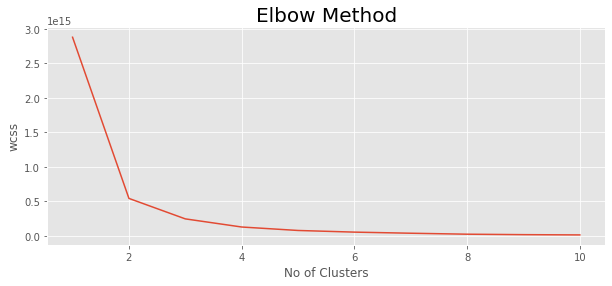

In [124]:
#Determining the optimum number of clusters within the Dataset

plt.rcParams['figure.figsize'] = (10,4)

wcss = []
for i in range(1,11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 2000, n_init = 10, random_state = 0)
    km.fit(x)
    wcss.append(km.inertia_)
    
#Plotting the results

plt.plot(range(1,11), wcss)
plt.title('Elbow Method', fontsize = 20)
plt.xlabel('No of Clusters')
plt.ylabel('wcss')
plt.show

We can see the number of k clusters to be used is 2 as used below

In [148]:
#Implementation of K Means algorithm to perform Clustering analysis

km = KMeans(n_clusters = 2, init = 'k-means++',  max_iter = 2000, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)

#Finding the results
a = df_irishdata['crops_type']
y_means = pd.DataFrame(y_means)
z = pd.concat([y_means, a], axis = 1)
z = z.rename(columns = {0: 'cluster'})

#Checking the clusters for each crop
print("Lets Check the results after applying K Means Clustering Analysis \n")
print("Crops in First Cluster:", z[z['cluster'] == 0]['crops_type'].unique())
print("...........................................")
print("Crops in Second Cluster:", z[z['cluster'] == 1]['crops_type'].unique())
print("...........................................")


Lets Check the results after applying K Means Clustering Analysis 

Crops in First Cluster: ['Apples' 'Barley' 'Beans, green' 'Berries nes'
 'Broad beans, horse beans, dry' 'Butter, cow milk'
 'Cabbages and other brassicas' 'Carrots and turnips'
 'Cauliflowers and broccoli' 'Cereals nes' 'Chillies and peppers, green'
 'Cucumbers and gherkins' 'Currants' 'Leeks, other alliaceous vegetables'
 'Lettuce and chicory' 'Mushrooms and truffles' 'Oats'
 'Oil, coconut (copra)' 'Onions, dry' 'Peas, dry' 'Peas, green' 'Potatoes'
 'Raspberries' 'Rye' 'Strawberries' 'Sugar beet' 'Tomatoes'
 'Vegetables, leguminous nes' 'Wheat' 'Whey, dry' 'Spinach' 'Apricots'
 'Avocados' 'Bananas' 'Chestnut' 'Figs' 'Fruit, citrus nes'
 'Fruit, pome nes' 'Fruit, stone nes' 'Grain, mixed'
 'Grapefruit (inc. pomelos)' 'Grapes' 'Hazelnuts, with shell' 'Kiwi fruit'
 'Lemons and limes' 'Lupins' 'Maize' 'Melons, other (inc.cantaloupes)'
 'Nuts nes' 'Olives' 'Oranges' 'Peaches and nectarines' 'Pulses nes'
 'Pumpkins, squash

In [149]:
#Splitting the Dataset for predictive modelling

y = df_irishdata['crops_type']
x = df_irishdata.drop(['crops_type','country','month','crop_measurement','crops_type','crops_action'], axis=1)

print("Shape of x:", x.shape)
print("Shape of y:", y.shape)

Shape of x: (12345, 10)
Shape of y: (12345,)


In [150]:
#Creating training and testing sets for results validation
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

print("The Shape Of x train:", x_train.shape)
print("The Shape Of x test:", x_test.shape)
print("The Shape Of y train:", y_train.shape)
print("The Shape Of y test:", y_test.shape)

The Shape Of x train: (9876, 10)
The Shape Of x test: (2469, 10)
The Shape Of y train: (9876,)
The Shape Of y test: (2469,)


In [151]:
#Creating a Predictive Model

from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)

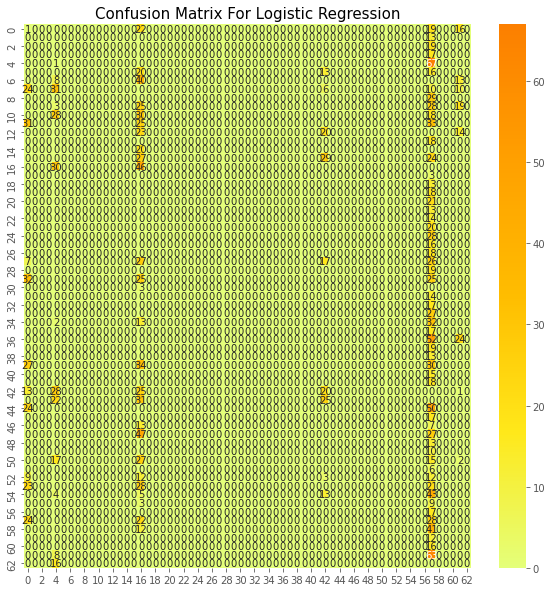

In [152]:
#Evaluating the model performance
from sklearn.metrics import confusion_matrix

#Printing the Confusing Matrix
plt.rcParams['figure.figsize'] = (10,10)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot = True, cmap = 'Wistia')
plt.title('Confusion Matrix For Logistic Regression', fontsize = 15)
plt.show()

In [153]:
#Defining the classification Report
from sklearn.metrics import classification_report

#Printing the Classification Report
cr = classification_report(y_test, y_pred)
print(cr)

                                              precision    recall  f1-score   support

                                      Apples       0.00      0.02      0.01        58
                                    Apricots       0.00      0.00      0.00        13
                                    Avocados       0.00      0.00      0.00        19
                                     Bananas       0.00      0.00      0.00        17
                                      Barley       0.01      0.01      0.01        68
                                Beans, green       0.00      0.00      0.00        49
                                 Berries nes       0.00      0.00      0.00        61
               Broad beans, horse beans, dry       0.00      0.00      0.00        81
                            Butter, cow milk       0.00      0.00      0.00        29
                Cabbages and other brassicas       0.00      0.00      0.00        75
                         Carrots and turnips       0.

In [154]:
#head of dataset
x.head()

,Year,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
0,2010,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5
1,2010,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3
2,2010,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2
3,2010,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0
4,2010,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6


I have entered in the values below for the suggested prediction though the accuracy is very low for this model

In [155]:
prediction = model.predict((np.array([[2010,620.0,79.9,14, 12, 5.7, 13.6, -6.2, -10.1, 1.2]])))
print("The Suggested Crop for given climatic condition is :",prediction)

The Suggested Crop for given climatic condition is : ['Currants']


# Irish - Models using crop value as the target dependant variable

# Descriptive stats on the target Crop Value

In [156]:
#Checking the crop_value present
df_irishdata['crop_value'].value_counts()

149249.495342    2662
10.000000         108
8.000000           91
230.000000         80
220.000000         72
                 ... 
16364.000000        7
545300.000000       7
237288.000000       7
89983.000000        7
247154.000000       7
Name: crop_value, Length: 640, dtype: int64

In [157]:
df_irishdata.head()

,Year,country,month,crop_measurement,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
0,2010,Ireland,January,ha,Apples,Area harvested,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5
1,2010,Ireland,February,ha,Apples,Area harvested,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3
2,2010,Ireland,March,ha,Apples,Area harvested,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2
3,2010,Ireland,April,ha,Apples,Area harvested,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0
4,2010,Ireland,May,ha,Apples,Area harvested,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6


In [158]:
#Inspect the dataframe to retrive the mean,min and max values for each column the quarters and std deviation
df_irishdata.describe()

,Year,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
count,12345.000000,1.234500e+04,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000
mean,2015.848765,1.814327e+05,124.603021,22.827380,18.195869,9.470871,18.014119,0.105978,-3.513427,5.748327
std,3.321685,4.830334e+05,56.473020,5.419035,5.232433,3.705427,4.966247,3.867283,4.760671,3.386088
min,2010.000000,1.000000e+00,20.200000,8.000000,6.000000,-0.400000,10.300000,-15.000000,-19.900000,-3.800000
25%,2013.000000,1.310000e+03,87.900000,20.000000,14.000000,6.100000,13.200000,-2.400000,-6.700000,3.100000
50%,2016.000000,5.798000e+04,112.800000,24.000000,18.000000,9.300000,17.200000,-0.500000,-3.500000,5.600000
75%,2019.000000,1.492495e+05,157.400000,27.000000,22.000000,12.700000,21.900000,3.300000,0.000000,8.800000
max,2020.000000,3.920000e+06,254.100000,31.000000,30.000000,17.300000,30.200000,9.500000,7.800000,12.500000


In [159]:
#Printing the mean of the target / dependant variable
mean_cropval= df_irishdata['crop_value'].mean()
print(mean_cropval)

181432.7401053934


In [160]:
#Printing the median of the target / dependant variable
median_cropval= df_irishdata['crop_value'].median()
print(median_cropval)

57980.0


In [161]:
#Printing the mode of the target / dependant variable
mode_cropval= df_irishdata['crop_value'].mode()
print(mode_cropval)

0    149249.495342
dtype: float64


[Text(0, 0.5, 'cropsvalue'),
 Text(0.5, 0, 'yield'),
 Text(0.5, 1.0, 'Crop Histogram')]

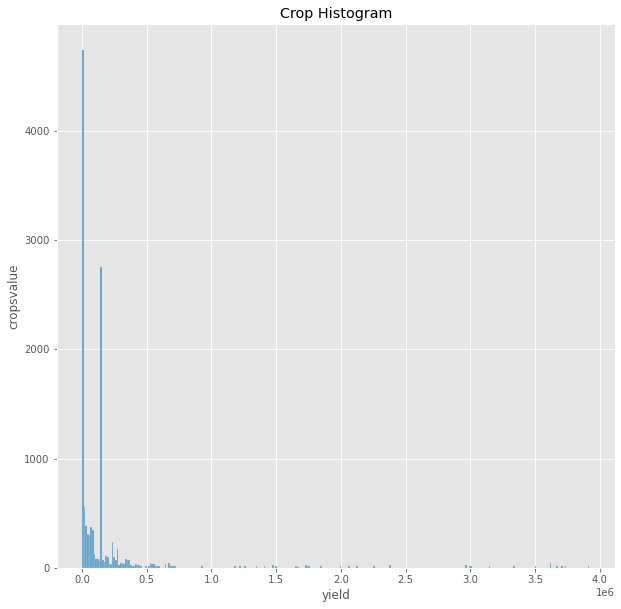

In [167]:
#Histplot of the crops value yield
ax = sns.histplot(df_irishdata.crop_value)
ax.set(xlabel='yield', ylabel='cropsvalue', title ='Crop Histogram')

We can see from the above graph that the variable selling price is slightly right or postively skewed

[Text(0, 0.5, 'Value of Crops'),
 Text(0.5, 0, 'produced'),
 Text(0.5, 1.0, 'Crops Histogram')]

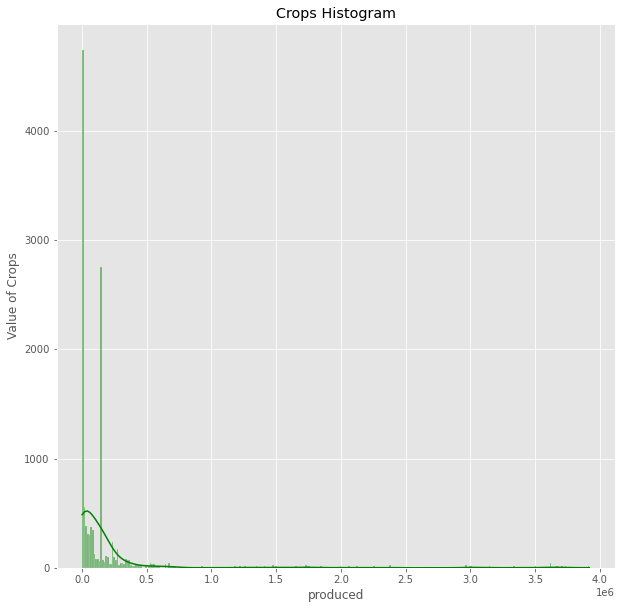

In [168]:
ax = sns.histplot(df_irishdata.crop_value, kde=True, color ='green')
ax.set(xlabel='produced', ylabel='Value of Crops', title ='Crops Histogram')

We can see from the above graph that the variable selling price is slightly right or postively skewed

Text(0.5, 1.0, 'Box plot crop_value')

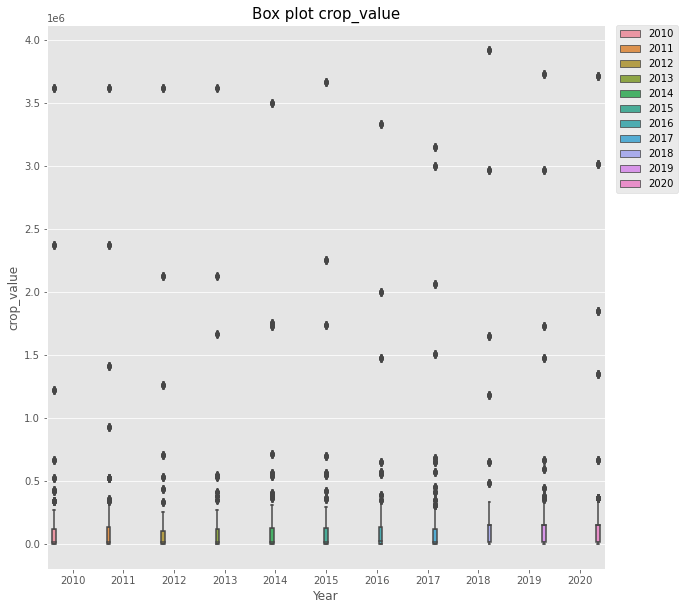

In [169]:
#boxplot of crops by year
sns.boxplot(x = 'Year', y ='crop_value', data=df_irishdata, hue = 'Year')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Box plot crop_value', fontsize=15)

In [170]:
#Sorting by year and aggreating the sum total
cropgrouping = df_irishdata.groupby('Year', axis = 0).sum()
cropgrouping

,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
Year,,,,,,,,,
2010,1.578876e+08,133178.2,21804,17617,7986.9,16992.9,-2449.0,-5869.700000,4068.5
2011,1.659811e+08,120498.7,21883,17380,8737.4,16210.8,474.0,-4194.900000,5356.2
2012,1.520143e+08,97414.9,21804,17064,8800.6,16590.0,15.8,-3009.900000,5451.0
2013,9.487463e+07,74070.4,13746,11139,5577.4,10388.5,1106.0,-987.500000,3452.3
2014,1.617810e+08,118207.7,22515,18091,9456.3,17269.4,1366.7,-1146.560761,6083.0
2015,1.702026e+08,133178.2,21804,17617,8532.0,15879.0,126.4,-2259.400000,4913.8
2016,1.593404e+08,95179.2,21646,17064,9219.3,17861.9,790.0,-2140.900000,5727.5
2017,1.993929e+08,132199.2,24864,20580,9895.2,18211.2,781.2,-1856.400000,6249.6
2018,2.851982e+08,171740.0,33232,25172,14198.0,27453.6,-570.4,-7576.400000,8419.6


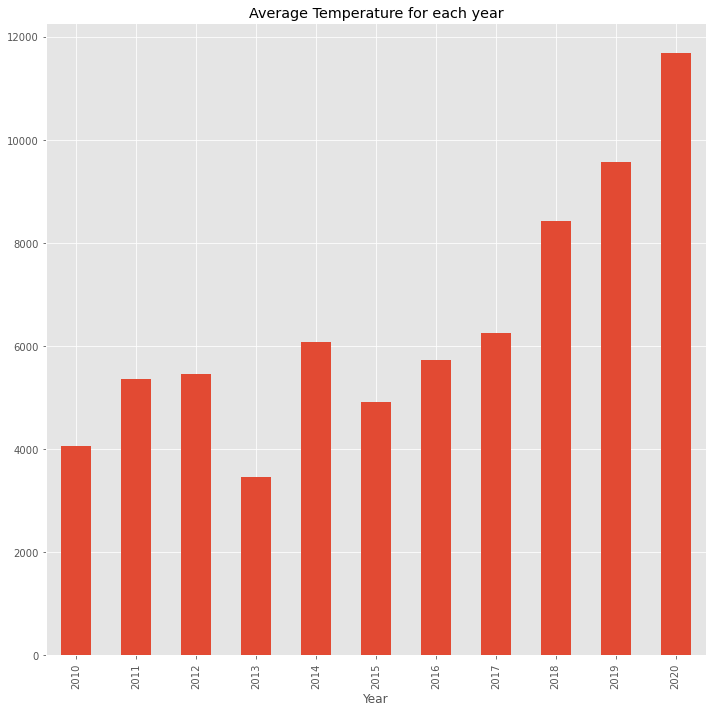

In [171]:
#Pie chart to display the average temperature each year in ireland
cropgrouping['average_temperature'].plot(kind='bar')

plt.title('Average Temperature for each year')
plt.tight_layout()

Below the Csv after been explored and cleaned has now been saved so as I can just read this in for my models going forward

In [172]:
#now that the data has been explored and cleaned saving it to be used for the models
df_irishdata.to_csv('df_irishmodels.csv')

# Read in df_irishmodels.csv into the df_irishdata frame for linear model

The advantage to this is I dont have to run the code from the top of the page to the bottom every time, I just need to run the imports beforhand.

In [2]:
#Reading in Irish Crops dataset from between 2010 to 2020 8 actions 10 crop measurements and 139 crop types
df_irishdata = pd.read_csv('df_irishmodels.csv')
df_irishdata.head()

,Unnamed: 0,Year,country,month,crop_measurement,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
0,0,2010,Ireland,January,ha,Apples,Area harvested,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5
1,1,2010,Ireland,February,ha,Apples,Area harvested,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3
2,2,2010,Ireland,March,ha,Apples,Area harvested,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2
3,3,2010,Ireland,April,ha,Apples,Area harvested,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0
4,4,2010,Ireland,May,ha,Apples,Area harvested,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6


# Feature Selection

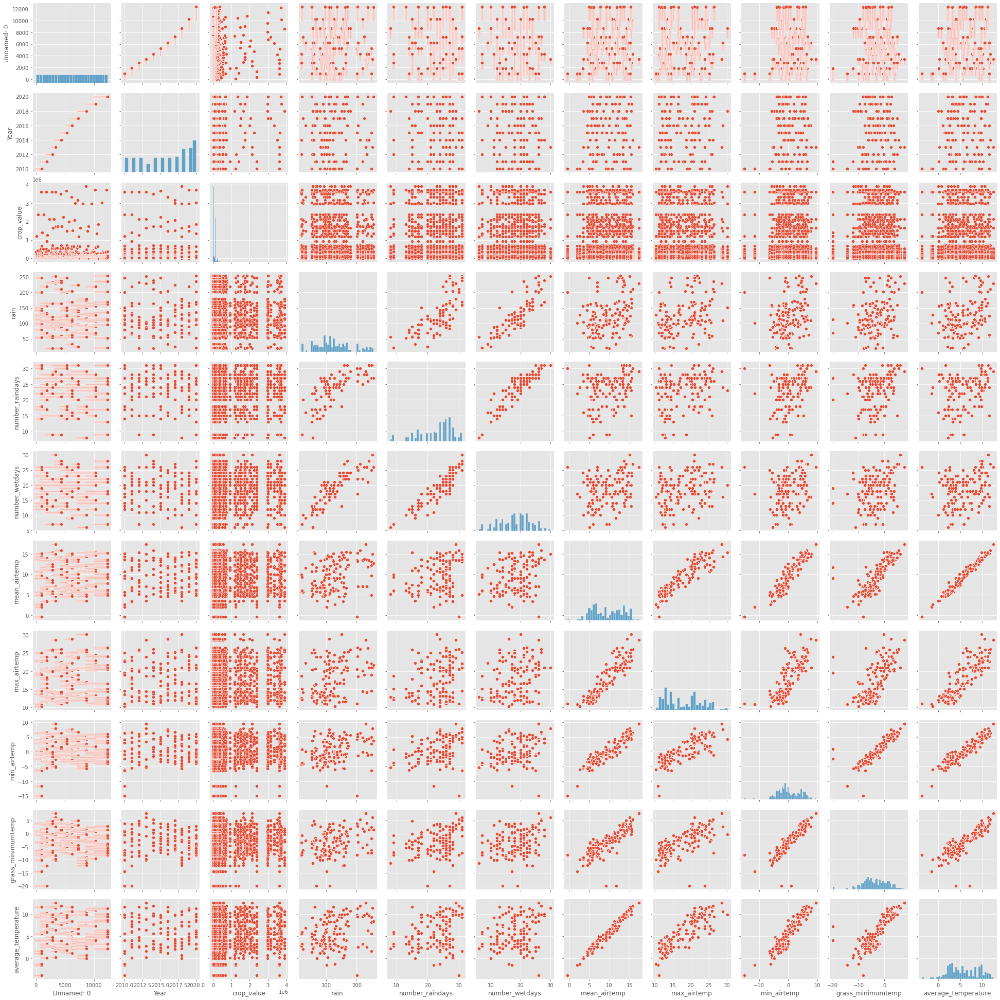

In [174]:
sns.pairplot(df_irishdata)

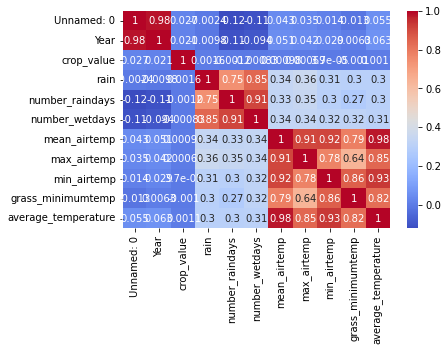

In [3]:
#Checking Correlation using heatmap
sns.heatmap(df_irishdata.corr(),annot=True,cmap='coolwarm')

Observation:

-1 indicates a perfectly negative linear correlation between two variables.
0 indicates no linear correlation between two variables.
1 indicates a perfectly positive linear correlation between two variables

We can see that Year and Average Temperature have a Perfectly Positive Linear Correlation between both features.
0.85 Rain and Number of Wetdays are correlated. 
0.64 Max airtemp and grass minimum temp are correlated.
0.79 grass_minimumtemp and mean/average airtemp are correlated.
0.86 grass_minimumtemp and minimum airtemp are correlated.

The target Crop_value we can see already does not have any correlation with any other feature :(

# Univariate Analysis

<Figure size 864x360 with 0 Axes>

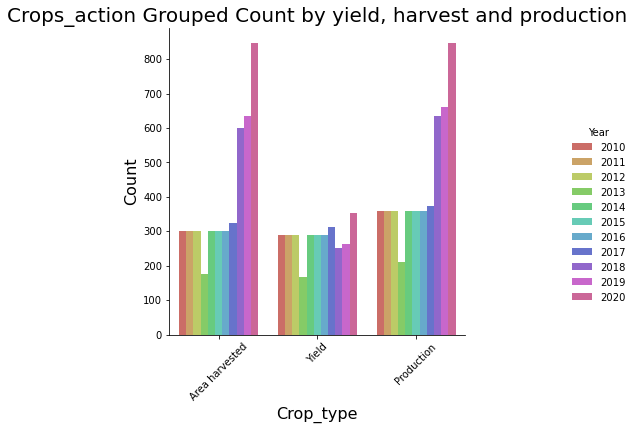

In [6]:
plt.figure(figsize=(12,5))
sns.catplot(x='crops_action', data=df_irishdata, palette="hls",kind='count',hue='Year')
plt.xlabel("Crop_type", fontsize=16)
plt.ylabel("Count", fontsize=16)
plt.title("Crops_action Grouped Count by yield, harvest and production", fontsize=20)
plt.xticks(rotation=45)
plt.show()

Observations:

1. Crop action harvest adn production were both highest in 2020
2. 2013 was the lowest year for all 3 type s harvest, yield and Production

# Bivariate Analysis

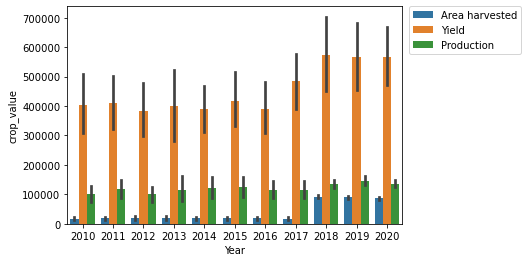

In [8]:
sns.barplot(x="Year" ,y="crop_value",hue="crops_action",data=df_irishdata)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

Observations:

    Clearly observed that the crop yield for years 2018, 2019 and 2020 were best.



# Outliers Analysis

In [10]:
#Lets use the describe function 
df_irishdata.describe()

,Unnamed: 0,Year,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
count,12345.000000,12345.000000,1.234500e+04,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000,12345.000000
mean,6172.000000,2015.848765,1.814327e+05,124.603021,22.827380,18.195869,9.470871,18.014119,0.105978,-3.513427,5.748327
std,3563.838871,3.321685,4.830334e+05,56.473020,5.419035,5.232433,3.705427,4.966247,3.867283,4.760671,3.386088
min,0.000000,2010.000000,1.000000e+00,20.200000,8.000000,6.000000,-0.400000,10.300000,-15.000000,-19.900000,-3.800000
25%,3086.000000,2013.000000,1.310000e+03,87.900000,20.000000,14.000000,6.100000,13.200000,-2.400000,-6.700000,3.100000
50%,6172.000000,2016.000000,5.798000e+04,112.800000,24.000000,18.000000,9.300000,17.200000,-0.500000,-3.500000,5.600000
75%,9258.000000,2019.000000,1.492495e+05,157.400000,27.000000,22.000000,12.700000,21.900000,3.300000,0.000000,8.800000
max,12344.000000,2020.000000,3.920000e+06,254.100000,31.000000,30.000000,17.300000,30.200000,9.500000,7.800000,12.500000


Observations:

1. I dont see any obvious outliers in the data above

In [11]:
df_irishdata.head()

,Unnamed: 0,Year,country,month,crop_measurement,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
0,0,2010,Ireland,January,ha,Apples,Area harvested,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5
1,1,2010,Ireland,February,ha,Apples,Area harvested,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3
2,2,2010,Ireland,March,ha,Apples,Area harvested,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2
3,3,2010,Ireland,April,ha,Apples,Area harvested,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0
4,4,2010,Ireland,May,ha,Apples,Area harvested,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6


In [12]:
#Dropping ID and Source column from the data for outlier analysis
df_irishdata.drop(columns=["Unnamed: 0","country","month","crop_measurement"],axis=1,inplace=True)
df_irishdata.dtypes

Year                     int64
crops_type              object
crops_action            object
crop_value             float64
rain                   float64
number_raindays          int64
number_wetdays           int64
mean_airtemp           float64
max_airtemp            float64
min_airtemp            float64
grass_minimumtemp      float64
average_temperature    float64
dtype: object

We have several categorical variables and will need to transform them into dummy variables with binary values in order to incorporate them into our model. This is done because despite having int values, they are not ordinal variables. In order to avoid multicollinearity we will also have to drop one of the dummy variables from each set. For example, 'month','crops_action','crops_type','country' the first variable will be dropped for our regression.

In [13]:
# create binary dummy variables from categorical variables and drop first column to avoid multicollinearity
df_irishdata = pd.get_dummies(df_irishdata, columns = ['crops_action','crops_type'],drop_first = True)


# inspect bike_data df with added dummy variables
df_irishdata.head(5)

,Year,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature,...,crops_type_Strawberries,crops_type_Sugar beet,crops_type_Sunflower seed,"crops_type_Tangerines, mandarins, clementines, satsumas",crops_type_Tomatoes,"crops_type_Vegetables, leguminous nes","crops_type_Walnuts, with shell",crops_type_Watermelons,crops_type_Wheat,"crops_type_Whey, dry"
0,2010,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5,...,0,0,0,0,0,0,0,0,0,0
1,2010,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3,...,0,0,0,0,0,0,0,0,0,0
2,2010,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2,...,0,0,0,0,0,0,0,0,0,0
3,2010,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0,...,0,0,0,0,0,0,0,0,0,0
4,2010,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6,...,0,0,0,0,0,0,0,0,0,0


After creating the dummy variables we want to inspect the new full list of variables.

In [14]:
# check all columns for Nans
df_irishdata.isna().any()

Year                                     False
crop_value                               False
rain                                     False
number_raindays                          False
number_wetdays                           False
                                         ...  
crops_type_Vegetables, leguminous nes    False
crops_type_Walnuts, with shell           False
crops_type_Watermelons                   False
crops_type_Wheat                         False
crops_type_Whey, dry                     False
Length: 74, dtype: bool

# Creating the Multiple Regression and Evaluating the Model

# To start we will create a multiple regression using all of the independant features to get a baseline.

We will be using backward selection where we start with all of the predictor variables in the model, and after evaluating the variables, remove less useful predictors one at a time or in batches for categorical variables. We will take a look at the strength of the model (adj r2) and the statistical significance (P-value) of the indepenent variables and determine how to proceed in revising the model.

Below I will be creating a multiple regression model which is a supervised machine learning parametric method. To do that I will split our data into a training set (70%) and a test set(30%) standard. I will be fiting the multiple linear regression to the features and data from the training set and then testing the performance of the model against the test set


In [15]:
# set the target variable
y = df_irishdata['crop_value']

# set the independent predictor variables
X = df_irishdata.drop('crop_value', axis=1)

# split data into training and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)# 70% training and 30% test
X_train = sm.add_constant(X_train)
print("Training split input- ", X_train.shape)
print("Testing split input- ", X_test.shape)
X_train.head()


Training split input-  (8641, 74)
Testing split input-  (3704, 73)


,const,Year,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature,...,crops_type_Strawberries,crops_type_Sugar beet,crops_type_Sunflower seed,"crops_type_Tangerines, mandarins, clementines, satsumas",crops_type_Tomatoes,"crops_type_Vegetables, leguminous nes","crops_type_Walnuts, with shell",crops_type_Watermelons,crops_type_Wheat,"crops_type_Whey, dry"
8128,1.0,2018,79.6,17,15,5.7,12.9,-2.9,-8.9,2.9,...,0,0,0,0,0,0,0,0,0,0
5832,1.0,2016,63.0,24,16,15.1,25.0,7.0,3.6,11.6,...,0,0,0,0,0,0,0,0,0,0
11166,1.0,2020,161.8,26,22,5.3,11.6,-0.8,-5.6,2.1,...,0,0,0,0,0,0,0,0,0,0
8278,1.0,2018,150.3,23,20,15.4,30.2,4.2,-0.3,9.9,...,0,0,0,0,0,0,0,0,0,0
4791,1.0,2015,79.9,14,12,6.8,12.9,-1.3,-2.7,3.3,...,0,0,0,0,0,0,0,0,0,0


# Model 1 Linear Regression using all independant variables/features

In [16]:
# fit data to linear regression
mlr1 = sm.OLS(y_train, X_train).fit()

# view OLS regression results
print(mlr1.summary())

                            OLS Regression Results                            
Dep. Variable:             crop_value   R-squared:                       0.368
Model:                            OLS   Adj. R-squared:                  0.363
Method:                 Least Squares   F-statistic:                     68.37
Date:                Sat, 21 May 2022   Prob (F-statistic):               0.00
Time:                        19:22:33   Log-Likelihood:            -1.2312e+05
No. Observations:                8641   AIC:                         2.464e+05
Df Residuals:                    8567   BIC:                         2.469e+05
Df Model:                          73                                         
Covariance Type:            nonrobust                                         
                                                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------

R Squared, also known as the coefficient of determination, displays the variation in the depdendent target variable y as explained by the independent predictor x variables. In other words, the percentage of the prediction outcome that can be attributed to the predictor variables of the model. Another way to look at it is R2 = explained variation / total variation. The higher the number the better the data fits the model in question.

Adjusted R Squared is used when multiple independent predictor variables exist and includes a penalty for adding additional predictors. This allows us to compare the effectiveness of different models with differing numbers of predictor variables. This is required because as I add predictors, R2 will always continue to increase, even if there is just a chance correlation between variables. In general a parsimonious model is preferred given that it meets reasonable Adjusted R Squared and statistical significance criteria.

P-Values measure the statistical significance of each variable in the model within the context of all variables in the model. It is essentially a measure of the liklihood of achieving results as extreme as were observed given a null hypothesis. In other words, the likeliness of the results being explained by random chance. A very low P-value is desired with .05 or .01 often being used as the standard depending on the context and several factors.

Model 1

Here we take a look at the strength of the model (adj r2) and the statistical significance (P-value) of the indepenent variables.

Adj R2:       0.363

There are many variables that have an unacceptably high P-value, particularly several of the categorical ones. Given that they are binary categorical dummy variables, it doesn't make much sense to keep some of them and drop only the problematic ones. For our second model we will be dropping all of variables below.

max_airtemp                                             
min_airtemp                                               
grass_minimumtemp

rain


# Model 2 - Linear Regression (Dropping all of the month columns the P values are high) backward selection

In [17]:
#Dropping all of the features below with a high p-value from the training model
X_train2 = X_train.drop(['rain','grass_minimumtemp','min_airtemp','max_airtemp'], axis=1)
mlr2 = sm.OLS(y_train, X_train2).fit()
print(mlr2.summary())

                            OLS Regression Results                            
Dep. Variable:             crop_value   R-squared:                       0.368
Model:                            OLS   Adj. R-squared:                  0.363
Method:                 Least Squares   F-statistic:                     72.34
Date:                Sat, 21 May 2022   Prob (F-statistic):               0.00
Time:                        19:23:15   Log-Likelihood:            -1.2312e+05
No. Observations:                8641   AIC:                         2.464e+05
Df Residuals:                    8571   BIC:                         2.469e+05
Df Model:                          69                                         
Covariance Type:            nonrobust                                         
                                                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------

There are still several variables that have an unacceptably high P-value, particularly the mean_airtemp                      average_temperature  variables. We will be dropping all of the hour variables as well for our third model and observing the change.

There is no change with the Adj R2: 0.363 value.


# Model 3 - Linear Regression (Dropping all of the hour columns) backward selection

In [18]:
#Dropping all of the Temperature features with a high p-value from the training model
X_train3 = X_train2.drop(['mean_airtemp','average_temperature'], axis=1)
mlr3 = sm.OLS(y_train, X_train3).fit()
print(mlr3.summary())

                            OLS Regression Results                            
Dep. Variable:             crop_value   R-squared:                       0.368
Model:                            OLS   Adj. R-squared:                  0.363
Method:                 Least Squares   F-statistic:                     74.51
Date:                Sat, 21 May 2022   Prob (F-statistic):               0.00
Time:                        19:23:39   Log-Likelihood:            -1.2312e+05
No. Observations:                8641   AIC:                         2.464e+05
Df Residuals:                    8573   BIC:                         2.469e+05
Df Model:                          67                                         
Covariance Type:            nonrobust                                         
                                                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------

Model 3

For our third model, we see that the adjusted R2 has stayed the same after dropping all hour features.

Adj. R-squared:   0.363

There are some of the actual crops with a very high P Value I will drop some of these to see does it improve our accuracy.


# Model 4 - Linear Regression (Dropping all of the cluster group columns as the p value is above 0.5) backward selection

In [19]:
#Dropping all of the categorial dummie Crop values  Group features with a high p-value from the training model
X_train4 = X_train3.drop(['crops_type_Cabbages and other brassicas','crops_type_Chillies and peppers, green','crops_type_Linseed','crops_type_Onions, dry','crops_type_Strawberries','crops_type_Whey, dry'], axis=1)
mlr4 = sm.OLS(y_train, X_train4).fit()
print(mlr4.summary())

                            OLS Regression Results                            
Dep. Variable:             crop_value   R-squared:                       0.368
Model:                            OLS   Adj. R-squared:                  0.363
Method:                 Least Squares   F-statistic:                     81.88
Date:                Sat, 21 May 2022   Prob (F-statistic):               0.00
Time:                        19:23:58   Log-Likelihood:            -1.2312e+05
No. Observations:                8641   AIC:                         2.464e+05
Df Residuals:                    8579   BIC:                         2.468e+05
Df Model:                          61                                         
Covariance Type:            nonrobust                                         
                                                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------

Model 4

For our fourth, we see that the adjusted R2 has not decreased after dropping the group of crops with a high Value.  The accuracy with Linear is almost 40percent and not considered good however all of the P Values are well under 0.5 and this cannot be improved upon.

Adj R2:    0.363

# After looking at the results from model 4 I will keep this as our final model as all pvalues are under 0.5 infact almost at 0

# Variance Inflation Factors (VIF)

Variance inflation factors range from a value of 1.0 and upwards. The VIF helps us quantify the severity of multicollinearity in an OLS regression. The VIF value tells us how much larger the standard error increases compared to if that variable had 0 correlation to other independent predictor variables in your model.


In [20]:
# create dataframe to calculate and display VIF for each variable
vif = pd.DataFrame()
vif['Features'] = X_train4.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train4.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif


,Features,VIF
0,const,528963.88
5,crops_action_Yield,87.30
9,crops_type_Barley,61.10
6,crops_type_Apricots,10.34
7,crops_type_Avocados,10.09
...,...,...
59,"crops_type_Walnuts, with shell",1.20
14,crops_type_Carrots and turnips,1.19
60,crops_type_Watermelons,1.10
41,crops_type_Oranges,1.08


# All of the variables have relatively low VIF values with the exception of station id which is still below our cuttoff of 5.0 which is acceptable.

Looking at the results above and interpreting them 1 = not correlated. Between 1 and 5 = moderately correlated. Greater than 5 = highly correlated. 

Moderately correlated 
59 	crops_type_Walnuts, with shell 	1.20
14 	crops_type_Carrots and turnips 	1.19
60 	crops_type_Watermelons 	1.10
41 	crops_type_Oranges 	1.08
28 	crops_type_Hazelnuts, with shell 	1.06

We can see that  features 5 to 12 have a VIF of infinity this means there is perfect correlation.

5 	crops_action_Yield 	87.30
9 	crops_type_Barley 	61.10
6 	crops_type_Apricots 	10.34
7 	crops_type_Avocados 	10.09


# Making Predictions With Final Model

We are going to create our final model for prediction using the final set of variables that we had in our final training model. 

In [21]:
# drop predictive variables to prepare final model
X_test = sm.add_constant(X_test)
X_test_1 = X_test[X_train4.columns] 

# fit data to linear regression for final model using test data
mlr_test = sm.OLS(y_test, X_test_1).fit()

# inspect X_test data
X_test_1.head()

,const,Year,number_raindays,number_wetdays,crops_action_Production,crops_action_Yield,crops_type_Apricots,crops_type_Avocados,crops_type_Bananas,crops_type_Barley,...,crops_type_Soybeans,crops_type_Spinach,crops_type_Sugar beet,crops_type_Sunflower seed,"crops_type_Tangerines, mandarins, clementines, satsumas",crops_type_Tomatoes,"crops_type_Vegetables, leguminous nes","crops_type_Walnuts, with shell",crops_type_Watermelons,crops_type_Wheat
6596,1.0,2017,25,21,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8527,1.0,2018,28,22,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1218,1.0,2011,23,15,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3666,1.0,2014,26,21,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11616,1.0,2020,22,17,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Now we will make predictions of the y variable which is bikes_available using our final test model

In [22]:
# Making predictions using the final model
y_pred = mlr_test.predict(X_test_1)

# Evaluating Predictions of Final Model

To evaluate our final model we will look a number of data points and visualizations. First we start off with a distribution plot of predicted y values subtracted from the actual y values from the test dataset. This will help us visualize the distribution of errors. We also take a look at a scatter plot of predicted y values vs actuals from the test data set.


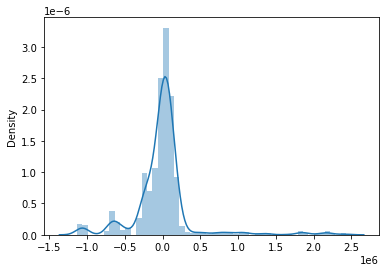

In [23]:
# distribution plot of predicted y values vs test y values
sns.distplot((y_test - y_pred), bins=50);

Text(0, 0.5, 'y_pred')

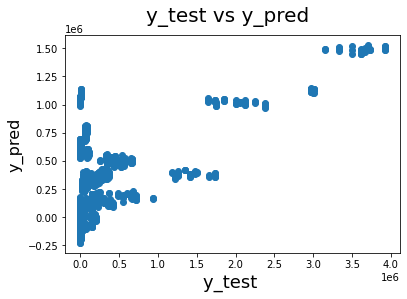

In [24]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)   
plt.xlabel('y_test ', fontsize=18)                       
plt.ylabel('y_pred', fontsize=16) 

We can see from the graph above observing the spread for y_pred and Y_test there is a couple of outliers but for the majority we can say that there is infact a high linear correlation. The RMSE is the standard deviation of the prediction errors also known as residuals. This helps us understand how well the actual data fits our model.


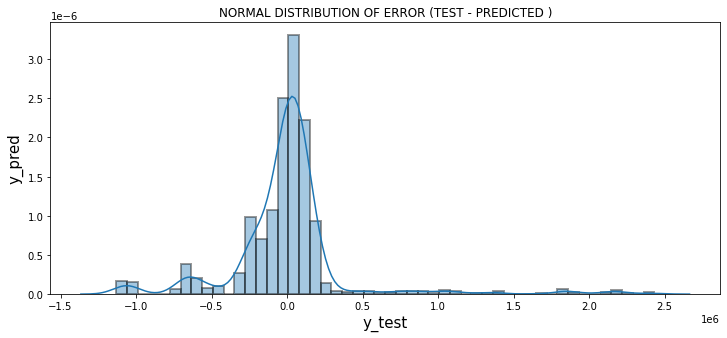

In [25]:
## * NORMAL DISTRIBUTION OF ERROR (TEST - PREDICTED ) *

plt.figure(figsize=(12,5))
sns.distplot((y_test-y_pred),bins=50,hist_kws=dict(edgecolor="k", linewidth=2));
plt.xlabel('y_test', fontsize='15')
plt.ylabel('y_pred', fontsize='15')
plt.title("NORMAL DISTRIBUTION OF ERROR (TEST - PREDICTED )")
plt.savefig("lr1")

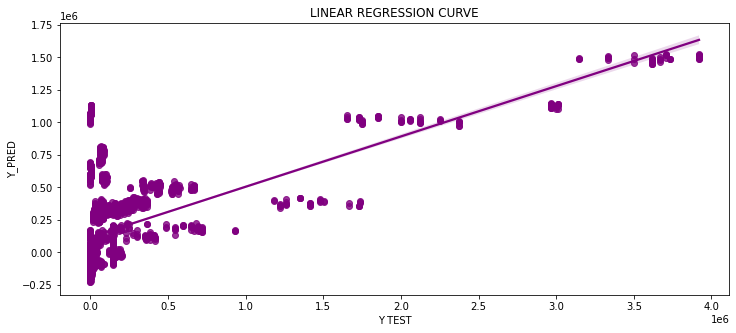

In [26]:
### LINEAR REGRESSION CURVE

plt.figure(figsize=(12,5))
sns.regplot(y_test,y_pred,df_irishdata,color='purple')
plt.xlabel("Y TEST")
plt.ylabel("Y_PRED")
plt.title("LINEAR REGRESSION CURVE")
plt.savefig("lr3")

Lastly, we will look at the R Squared (R2), Adjusted R Squared (Adj R2), and Root Mean Square Error (RMSE) values for the predictions.

The RMSE is the standard deviation of the prediction errors also known as residuals. This helps us understand how well the actual data fits our model.


In [27]:
# create R2 score
r2 = r2_score(y_test, y_pred)

# create Adjusted R2 Score
p = len(X_test_1.columns)
n = y_test.shape[0]
adj_r2 = 1 - (1 - r2) * ((n - 1)/(n-p-1))

# create RMSE score
rmse = mean_squared_error(y_test, y_pred, squared = False)


# print final model performance stats
print(str(p) + " Predictors in Test Set")
print(str(n) + " Records in Test Set")
print("R2: " + str(r2))
print("Adj R2: " + str(adj_r2))
print("RMSE: " + str(rmse))

62 Predictors in Test Set
3704 Records in Test Set
R2: 0.3868084340285938
Adj R2: 0.37636683087280487
RMSE: 401987.58632765774


Let's compare the R2 and Adj R2 values from the training dataset vs the test dataset.

Training Dataset

R2: 0.3868084340285938
Adj R2: 0.37636683087280487



# Final Linear Model Conclusion

In [28]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 209684.34449265996
Mean Squared Error: 161594019561.5361
Root Mean Squared Error: 401987.58632765774


MAE: A metric that tells us the mean absolute difference between the predicted values and the actual values in a dataset. The lower the MAE, the better a model fits a dataset

The lower the MSE the higher the accuracy of prediction as there would be excellent match between the actual and predicted data set

RMSE: A metric that tells us the square root of the average squared difference between the predicted values and the actual values in a dataset. The lower the RMSE, the better a model fits a dataset


In [29]:
#print the R2_Score
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.3868084340285938

# Multiple Linear Regression Not using Stats Models

In [31]:
#Reading in df_irishdmodels cleaned dataset
df_irishdata = pd.read_csv('df_irishmodels.csv')




In [32]:
#Dropping the below 3 columns from our regression
df_irishdata.drop('month', axis=1, inplace=True)
df_irishdata.drop('country', axis=1, inplace=True)
df_irishdata.drop('Unnamed: 0', axis=1, inplace=True)
df_irishdata.drop('crop_measurement', axis=1, inplace=True)

In [33]:
df_irishdata.head()

,Year,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
0,2010,Apples,Area harvested,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5
1,2010,Apples,Area harvested,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3
2,2010,Apples,Area harvested,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2
3,2010,Apples,Area harvested,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0
4,2010,Apples,Area harvested,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6


In [34]:
# create binary dummy variables from categorical variables and drop first column to avoid multicollinearity
df_irishdata = pd.get_dummies(df_irishdata, columns = ['crops_action','crops_type'],drop_first = True)


# inspect bike_data df with added dummy variables
df_irishdata.head(5)

,Year,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature,...,crops_type_Strawberries,crops_type_Sugar beet,crops_type_Sunflower seed,"crops_type_Tangerines, mandarins, clementines, satsumas",crops_type_Tomatoes,"crops_type_Vegetables, leguminous nes","crops_type_Walnuts, with shell",crops_type_Watermelons,crops_type_Wheat,"crops_type_Whey, dry"
0,2010,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5,...,0,0,0,0,0,0,0,0,0,0
1,2010,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3,...,0,0,0,0,0,0,0,0,0,0
2,2010,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2,...,0,0,0,0,0,0,0,0,0,0
3,2010,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0,...,0,0,0,0,0,0,0,0,0,0
4,2010,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6,...,0,0,0,0,0,0,0,0,0,0


In [35]:
# set the target variable
y = df_irishdata['crop_value']

# set the independent predictor variables
X = df_irishdata.drop('crop_value', axis=1)

In [36]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

print("Training split input- ", X_train.shape)
print("Testing split input- ", X_test.shape)
X_train.head()

Training split input-  (8641, 73)
Testing split input-  (3704, 73)


,Year,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature,crops_action_Production,...,crops_type_Strawberries,crops_type_Sugar beet,crops_type_Sunflower seed,"crops_type_Tangerines, mandarins, clementines, satsumas",crops_type_Tomatoes,"crops_type_Vegetables, leguminous nes","crops_type_Walnuts, with shell",crops_type_Watermelons,crops_type_Wheat,"crops_type_Whey, dry"
10052,2019,107.8,21,17,9.1,22.0,-0.5,-4.9,4.7,0,...,1,0,0,0,0,0,0,0,0,0
6625,2017,124.2,20,19,13.2,20.5,4.6,1.5,9.7,0,...,0,0,0,0,0,0,0,0,0,0
4066,2014,110.2,21,18,14.1,25.1,1.7,0.6,9.5,0,...,0,0,0,0,0,0,0,0,0,0
7476,2018,116.4,28,20,14.3,21.0,5.2,1.2,10.5,1,...,0,0,0,0,0,0,0,0,0,0
1995,2012,102.1,26,18,11.1,25.6,-0.2,-2.4,6.6,1,...,0,0,0,0,0,0,0,0,0,0


In [37]:
# Training the Multiple Linear Regression model on the Training set
#This is the same code we used in Simple Linear Regression
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [38]:
# Predicting the Test set results
#Remember that we need to check our training results on the Test set but we can't plot a graph
y_pred = regressor.predict(X_test)
np.set_printoptions(precision=2) #we display values with only 2 decimals after the comma

In [39]:
#We calculate the precision of the model or r^2
print('The precision of the model is ')
print(regressor.score(X_train, y_train))

The precision of the model is 
0.3662813965408267


In [40]:
#We build the equation
print('a = ')
print(regressor.coef_)

print('The interception is: ')
print(regressor.intercept_)

a = 
[ 3.31e+03  1.15e+02  8.90e+02 -1.92e+03  1.05e+04 -3.10e+03  1.27e+03
 -9.42e+02 -8.13e+03  6.52e+04  4.18e+05  1.62e+05  1.69e+05  1.65e+05
  4.69e+05 -6.49e+04 -8.66e+04 -7.16e+04  1.85e+05 -3.71e+03  1.15e+05
 -4.76e+04 -8.53e+04  1.65e+05  1.51e+03  5.81e+05 -8.13e+04  1.64e+05
  1.64e+05  1.61e+05  1.64e+05  1.61e+05  1.62e+05  1.63e+05  1.62e+05
  1.62e+05  1.63e+05 -1.88e+04  1.61e+05 -1.54e+04  4.49e+04  1.62e+05
  1.61e+05  1.61e+05  6.12e+05  1.59e+05 -1.02e+04  1.50e+05  1.64e+05
 -3.24e+03  1.61e+05  1.61e+05 -9.06e+04 -8.25e+04  1.42e+05  1.63e+05
 -4.91e+04 -5.78e+04  1.65e+05  1.32e+05 -2.97e+04  1.29e+05 -6.16e+04
  6.67e+03  1.23e+05 -1.46e+04  1.66e+05  1.07e+06  1.19e+05  1.66e+05
  1.65e+05  1.68e+05  3.40e+04]
The interception is: 
-6723256.5997416265


Regression Diagnostics

The aim was to confirm whether the underlying assumptions of linear regression have been met which includes linearity, homoscedasticity, indpendence and normality. An asssement of various plots and statistical testing would reveal the above.

The Scale Location Plot would indicate whether (homoscedasticity or heterescedasticity) is present among residuals. The line should be roughly horizontal which would give an indication that the variance of the residuals is approximately the same for all the fitted values. Also, no patterns should be visual among the residuals. These two conditions if met would indicate homosedasticity, one of the underlying assumptions of linear regression.

The Actual vs Fitted plot is used to compare both the predicted values and the actual values. Ideally, the individual points in this plot should be close to forming a 45 degree straight line, indicating that predicted values are close to the actual values.

Residuals vs Fitted plot can utilized to identify non linearity, non - constant error variances and outliers. In this plot we would be looking for the residuals to be spread equaly around a horizontal line with no distinct patterns visible. This would further solidify homscedasticity.

The Normal QQ Plot will indicate whether the residuals are following a normal distribution or whether they deviate from a normal distibution. In this plot we are looking for the residuals to follow close to the line, if they dieviate this indicates the residuals do not follow a nomral distribution.

There are Statisitcal Measure's such as:

The 'Breush Pogan Test' which is used to check for varaince equality. The resulting value returned will inidcate whether the homoscedacitiy/heteroscacity is present among residuals.

The Durbin Watson Test could be utilized in this case to identify whether there is correlation present among the residuals. A value close to [2] reveals there is no correlation present. A value close to [0] reveals a strong positve correaltion is present and where values closer to [4] would indicate strong negative correlation being present.

All of the above techniques and metrics help identify whether the underlying assumptions of linear regression have been met.


# Ridge Regression - Model 2

In [120]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet

We will first train our first ridge regression model by setting to 1. This is the equivalent of running ordinary least squares regression with no penalty. Note that Scikit confusingly names the lambda parameter as alpha.

In [121]:
#Reading in df_irishdmodels cleaned dataset
df_irishdata = pd.read_csv('df_irishmodels.csv')

In [122]:
#Dropping the below 3 columns from our regression
df_irishdata.drop('month', axis=1, inplace=True)
df_irishdata.drop('country', axis=1, inplace=True)
df_irishdata.drop('Unnamed: 0', axis=1, inplace=True)
df_irishdata.drop('crop_measurement', axis=1, inplace=True)

In [123]:
#inspect dataframe
df_irishdata.head()

,Year,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
0,2010,Apples,Area harvested,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5
1,2010,Apples,Area harvested,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3
2,2010,Apples,Area harvested,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2
3,2010,Apples,Area harvested,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0
4,2010,Apples,Area harvested,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6


In [124]:
from sklearn.linear_model import Ridge
ridge = Ridge().fit(X_train, y_train)
print("Training set score: {:.4f}".format(ridge.score(X_train, y_train)))
print("Test set score: {:.4f}".format(ridge.score(X_test, y_test)))

Training set score: 0.3680
Test set score: 0.3780


In [125]:
# alpha = 10
ridge10 = Ridge(alpha=10).fit(X_train, y_train)
print("Training set score: {:.2f}".format(ridge10.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge10.score(X_test, y_test)))

Training set score: 0.37
Test set score: 0.38


In [126]:
# alpha = 0.1
ridge01 = Ridge(alpha=0.1).fit(X_train, y_train)
print("Training set score: {:.2f}".format(ridge01.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge01.score(X_test, y_test)))

Training set score: 0.37
Test set score: 0.38


# Logistic Regression Classification (binary) - Model 3

In [299]:
#Reading in df_irishdmodels cleaned dataset
df_irishdata = pd.read_csv('df_irishmodels.csv')

In [300]:
#Dropping the below 3 columns from our regression
df_irishdata.drop('month', axis=1, inplace=True)
df_irishdata.drop('country', axis=1, inplace=True)
df_irishdata.drop('Unnamed: 0', axis=1, inplace=True)
df_irishdata.drop('crop_measurement', axis=1, inplace=True)

In [301]:
df_irishdata.head()

,Year,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
0,2010,Apples,Area harvested,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5
1,2010,Apples,Area harvested,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3
2,2010,Apples,Area harvested,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2
3,2010,Apples,Area harvested,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0
4,2010,Apples,Area harvested,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6


In [302]:
#Printing the mean of the target / dependant variable
mean_cropval= df_irishdata['crop_value'].mean()
print(mean_cropval)

181432.7401053934


# Creating a new feature called Average Crop Price to find out if the crop value is less than the cropaverage value
81432.7401053934 1 or 0 if the crop value is higer than the average (mean)

In [303]:
#The affordable column now has a value of 1 whenever the price is < 81432.7401053934, and 0 otherwise.
df_irishdata['average_crop_value'] = np.where(df_irishdata['crop_value'] < 181432.7401053934, 1, 0)
df_irishdata

,Year,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature,average_crop_value
0,2010,Apples,Area harvested,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5,1
1,2010,Apples,Area harvested,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3,1
2,2010,Apples,Area harvested,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2,1
3,2010,Apples,Area harvested,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0,1
4,2010,Apples,Area harvested,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12340,2020,Wheat,Production,364920.0,202.5,26,17,15.2,24.1,6.0,2.8,11.2,0
12341,2020,Wheat,Production,364920.0,135.2,25,18,12.6,21.0,-0.1,-1.6,8.6,0
12342,2020,Wheat,Production,364920.0,21.7,9,7,9.3,15.1,0.7,-0.7,5.9,0
12343,2020,Wheat,Production,364920.0,52.9,13,10,7.8,15.2,-0.7,-3.9,4.9,0


In [304]:
df_irishdata['average_crop_value'].describe()

count    12345.000000
mean         0.832483
std          0.373452
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: average_crop_value, dtype: float64

# Splitting the data below in train test and dev

In [305]:
df_train, df_test = train_test_split(df_irishdata, test_size=0.2, random_state=20, stratify=df_irishdata['average_crop_value'])
df_train, df_dev = train_test_split(df_train, test_size=0.20, random_state=40)

# ensure our dataset splits are of the % sizes we want
total_size = len(df_train) + len(df_dev) + len(df_test)
print("train:", len(df_train), "=>", len(df_train) / total_size)
print("dev:", len(df_dev), " =>", len(df_dev) / total_size)
print("test:", len(df_test), "=>", len(df_test) / total_size)

train: 7900 => 0.639935196435804
dev: 1976  => 0.16006480356419603
test: 2469 => 0.2


In [306]:
df_irishdata.head()

,Year,crops_type,crops_action,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature,average_crop_value
0,2010,Apples,Area harvested,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5,1
1,2010,Apples,Area harvested,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3,1
2,2010,Apples,Area harvested,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2,1
3,2010,Apples,Area harvested,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0,1
4,2010,Apples,Area harvested,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6,1


Removing 'average_crop_value' from the dataframes below and creating it as a seperate prediction dataframe

In [307]:
# training
x_train = df_train.drop(['crop_value', 'average_crop_value'], axis=1)
y_train = pd.DataFrame(data=df_train['average_crop_value'], columns=["average_crop_value"])

# dev
x_dev = df_dev.drop(['crop_value', 'average_crop_value'], axis=1)
y_dev = pd.DataFrame(data=df_dev["average_crop_value"], columns=["average_crop_value"])

# test
x_test = df_test.drop(['crop_value', 'average_crop_value'], axis=1)
y_test = pd.DataFrame(data=df_test['average_crop_value'], columns=["average_crop_value"])

# EDA and cleaning based on the training set, x_train

In [308]:
for col in x_train.columns:
    print(col, ":", np.sum([x_train[col].isnull()]))

Year : 0
crops_type : 0
crops_action : 0
rain : 0
number_raindays : 0
number_wetdays : 0
mean_airtemp : 0
max_airtemp : 0
min_airtemp : 0
grass_minimumtemp : 0
average_temperature : 0


In [309]:
# dropping the null values
df_irishdata.dropna(axis=0,inplace=True)

In [310]:
#checking the shape after dropping
print("The shape of the data after dropping the null values is: ",df_irishdata.shape)

The shape of the data after dropping the null values is:  (12345, 13)


In [311]:
x_train.describe()

,Year,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature
count,7900.000000,7900.000000,7900.000000,7900.000000,7900.000000,7900.000000,7900.000000,7900.000000,7900.000000
mean,2015.839494,124.643076,22.812911,18.176329,9.496228,18.037481,0.128646,-3.491861,5.771051
std,3.320392,56.534588,5.426528,5.232986,3.712136,4.993913,3.863162,4.785978,3.388950
min,2010.000000,20.200000,8.000000,6.000000,-0.400000,10.300000,-15.000000,-19.900000,-3.800000
25%,2013.000000,87.900000,20.000000,14.000000,6.100000,13.200000,-2.400000,-6.700000,3.200000
50%,2016.000000,112.800000,24.000000,18.000000,9.300000,17.700000,-0.500000,-3.500000,5.600000
75%,2019.000000,157.400000,27.000000,22.000000,12.700000,21.900000,3.300000,0.000000,8.800000
max,2020.000000,254.100000,31.000000,30.000000,17.300000,30.200000,9.500000,7.800000,12.500000


In [312]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7900 entries, 3443 to 10383
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year                 7900 non-null   int64  
 1   crops_type           7900 non-null   object 
 2   crops_action         7900 non-null   object 
 3   rain                 7900 non-null   float64
 4   number_raindays      7900 non-null   int64  
 5   number_wetdays       7900 non-null   int64  
 6   mean_airtemp         7900 non-null   float64
 7   max_airtemp          7900 non-null   float64
 8   min_airtemp          7900 non-null   float64
 9   grass_minimumtemp    7900 non-null   float64
 10  average_temperature  7900 non-null   float64
dtypes: float64(6), int64(3), object(2)
memory usage: 740.6+ KB


In [313]:
#checking the shape after dropping
print("The shape of the data after dropping the null values is: ",y_train.shape)

The shape of the data after dropping the null values is:  (7900, 1)


The remaining columns of our training data all have reasonable summary statistics. None of the min's or max's are a cause for concern, and we have no reason to assert a certain distribution of values. Since all the feature values are within reasonable ranges, and there are no missing values (NaNs) remaining

In [314]:
for col in x_train.columns:
   print(col, ":", np.sum([x_train[col].isnull()]))

Year : 0
crops_type : 0
crops_action : 0
rain : 0
number_raindays : 0
number_wetdays : 0
mean_airtemp : 0
max_airtemp : 0
min_airtemp : 0
grass_minimumtemp : 0
average_temperature : 0


In [315]:
[col for col in x_train.columns]

['Year',
 'crops_type',
 'crops_action',
 'rain',
 'number_raindays',
 'number_wetdays',
 'mean_airtemp',
 'max_airtemp',
 'min_airtemp',
 'grass_minimumtemp',
 'average_temperature']

The scatterplot is great for this, as it provides us with a high-level picture of how every pair of features correlates. If any subplot of features depicts a linear relationship (i.e., a clear, concise path with mass concentrated together), then we can assume there exists some collinearity -- that the two features overlap in what they are capturing and that they are not independent from each other

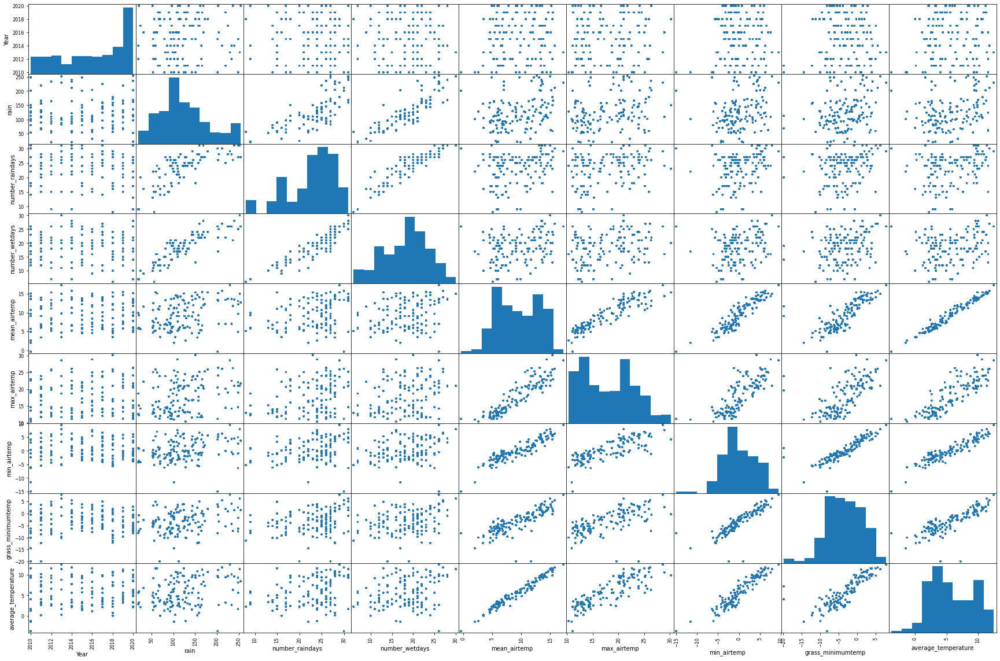

In [316]:
scatter_matrix(x_train, figsize=(30,20));

# Predicing with maximum likelihood estimation (MLE) using the training set MLE for 𝑦, where 𝑦∈{0,1}

In [317]:
mle_y = y_train['average_crop_value'].value_counts().idxmax()
dev_accuracy = y_dev['average_crop_value'].value_counts()[mle_y] / len(y_dev['average_crop_value'])
dev_accuracy

0.833502024291498

Our Predictions using logistic Regression are 83percent percent so this is a high level of accuracy

# Model 4 Decision Tree Regression

In [318]:
#Reading in df_irishdmodels cleaned dataset
df_irishdata = pd.read_csv('df_irishmodels.csv')

In [319]:
#Dropping the below 3 columns from our regression
df_irishdata.drop('month', axis=1, inplace=True)
df_irishdata.drop('country', axis=1, inplace=True)
df_irishdata.drop('Unnamed: 0', axis=1, inplace=True)
df_irishdata.drop('crop_measurement', axis=1, inplace=True)

In [320]:
# create binary dummy variables from categorical variables and drop first column to avoid multicollinearity
df_irishdata = pd.get_dummies(df_irishdata, columns = ['crops_action','crops_type'],drop_first = True)


# inspect bike_data df with added dummy variables
df_irishdata.head(5)

,Year,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature,...,crops_type_Strawberries,crops_type_Sugar beet,crops_type_Sunflower seed,"crops_type_Tangerines, mandarins, clementines, satsumas",crops_type_Tomatoes,"crops_type_Vegetables, leguminous nes","crops_type_Walnuts, with shell",crops_type_Watermelons,crops_type_Wheat,"crops_type_Whey, dry"
0,2010,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5,...,0,0,0,0,0,0,0,0,0,0
1,2010,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3,...,0,0,0,0,0,0,0,0,0,0
2,2010,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2,...,0,0,0,0,0,0,0,0,0,0
3,2010,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0,...,0,0,0,0,0,0,0,0,0,0
4,2010,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6,...,0,0,0,0,0,0,0,0,0,0


In [321]:
#inspect dataframe after dropping columns
df_irishdata.head()

,Year,crop_value,rain,number_raindays,number_wetdays,mean_airtemp,max_airtemp,min_airtemp,grass_minimumtemp,average_temperature,...,crops_type_Strawberries,crops_type_Sugar beet,crops_type_Sunflower seed,"crops_type_Tangerines, mandarins, clementines, satsumas",crops_type_Tomatoes,"crops_type_Vegetables, leguminous nes","crops_type_Walnuts, with shell",crops_type_Watermelons,crops_type_Wheat,"crops_type_Whey, dry"
0,2010,620.0,101.5,22,17,2.0,10.9,-11.6,-14.5,-1.5,...,0,0,0,0,0,0,0,0,0,0
1,2010,620.0,128.0,24,16,2.6,10.3,-6.1,-10.0,-1.3,...,0,0,0,0,0,0,0,0,0,0
2,2010,620.0,79.9,14,12,5.7,13.6,-6.2,-10.1,1.2,...,0,0,0,0,0,0,0,0,0,0
3,2010,620.0,112.5,27,19,9.1,19.6,-2.4,-19.9,4.0,...,0,0,0,0,0,0,0,0,0,0
4,2010,620.0,53.8,17,13,10.7,25.1,0.3,-3.2,5.6,...,0,0,0,0,0,0,0,0,0,0


In [322]:
# set the target variable

X = df_irishdata.iloc[:, 1:74].values
y = df_irishdata.iloc[:, 4].values
# set the independent predictor variables


In [323]:
# Fitting Decision Tree Regression to the dataset
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(random_state = 0)
regressor.fit(X, y)

DecisionTreeRegressor(random_state=0)

In [324]:
# splitting the dataaset into Training and Testing Data 
from sklearn.model_selection import train_test_split

# random state is 0 and test size if 30%
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30, random_state=0)#70 Training and 30 Test
print("Training split input- ", X_train.shape)
print("Testing split input- ", X_test.shape)

Training split input-  (8641, 73)
Testing split input-  (3704, 73)


Once we split the data, the next step is to scale our dataset so the extreme values will not have too much effect on the prediction of our model. Notice that we are only scaling the input values, not the output ones. Now, our data is ready for training the model using a decision tree algorithm.

# Fitting the model using Standard Scaler

In [325]:
# importing standard scalling method from sklearn
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

# providing the inputs for the scalling purpose
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Training the Decision Tree

In [326]:
# import the regressor
from sklearn.tree import DecisionTreeRegressor 
  
# create a regressor object
regressor = DecisionTreeRegressor(random_state = 0) 
  
# fit the regressor with X and Y data
regressor.fit(X, y)

DecisionTreeRegressor(random_state=0)

In [327]:
#Predicting the outputs
y_pred = regressor.predict(X_test)

# Visualising Decision Tree (Training Model)using Sklearn

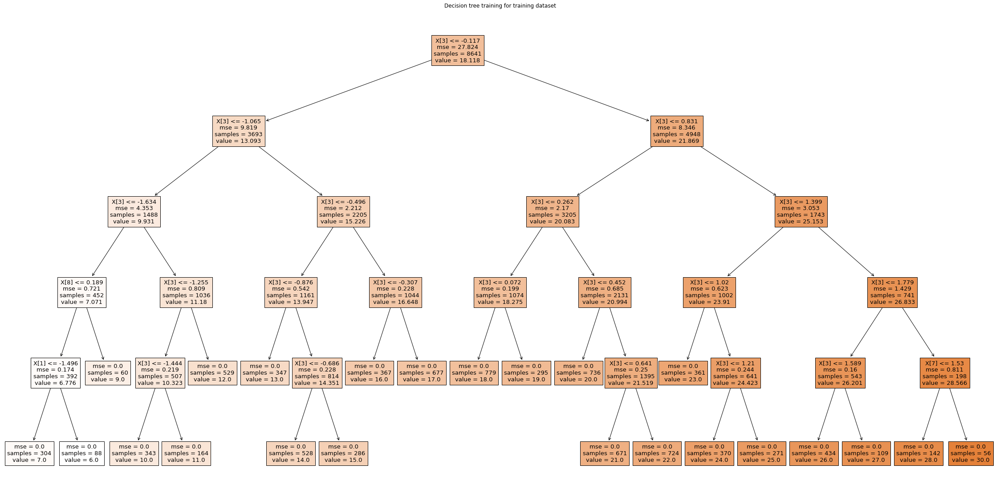

In [328]:
# importing the plot tree method
from sklearn.tree import DecisionTreeRegressor, plot_tree
clf = DecisionTreeRegressor()

# output size of decision tree
plt.figure(figsize=(40,20))

# providing the training dataset
clf = clf.fit(X_train, y_train)
plot_tree(clf, filled=True)
plt.title("Decision tree training for training dataset")
plt.show()

# Visualising Decision Tree (Testing Dataset)using Sklearn

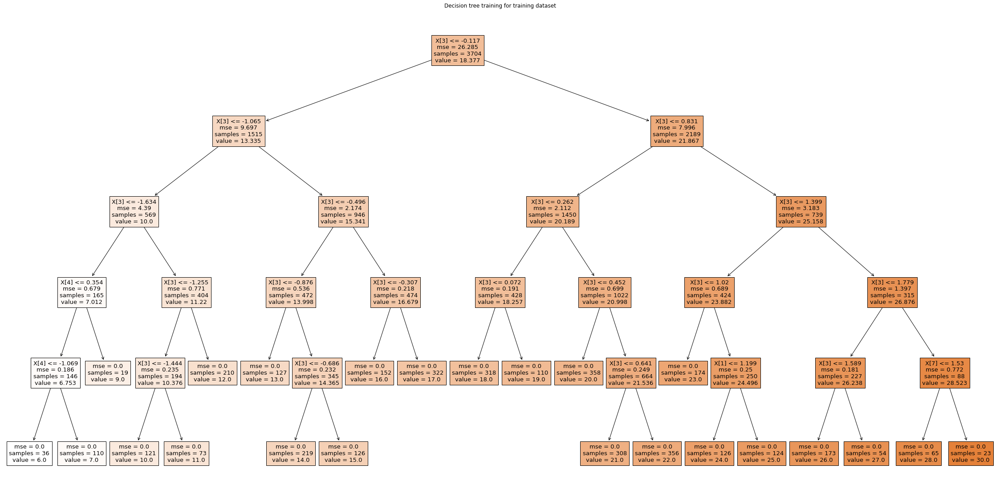

In [329]:
# importing the plot tree method
from sklearn.tree import DecisionTreeRegressor, plot_tree
clf = DecisionTreeRegressor()

# output size of decision tree
plt.figure(figsize=(40,20))

# providing the training dataset
clf = clf.fit(X_test, y_test)
plot_tree(clf, filled=True)
plt.title("Decision tree training for training dataset")
plt.show()

# Decision Tree Text based Tree

In [330]:
# importing the tree
from sklearn import tree

# text based tree
text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_3 <= -0.12
|   |--- feature_3 <= -1.07
|   |   |--- feature_3 <= -1.63
|   |   |   |--- feature_4 <= 0.35
|   |   |   |   |--- feature_4 <= -1.07
|   |   |   |   |   |--- value: [6.00]
|   |   |   |   |--- feature_4 >  -1.07
|   |   |   |   |   |--- value: [7.00]
|   |   |   |--- feature_4 >  0.35
|   |   |   |   |--- value: [9.00]
|   |   |--- feature_3 >  -1.63
|   |   |   |--- feature_3 <= -1.25
|   |   |   |   |--- feature_3 <= -1.44
|   |   |   |   |   |--- value: [10.00]
|   |   |   |   |--- feature_3 >  -1.44
|   |   |   |   |   |--- value: [11.00]
|   |   |   |--- feature_3 >  -1.25
|   |   |   |   |--- value: [12.00]
|   |--- feature_3 >  -1.07
|   |   |--- feature_3 <= -0.50
|   |   |   |--- feature_3 <= -0.88
|   |   |   |   |--- value: [13.00]
|   |   |   |--- feature_3 >  -0.88
|   |   |   |   |--- feature_3 <= -0.69
|   |   |   |   |   |--- value: [14.00]
|   |   |   |   |--- feature_3 >  -0.69
|   |   |   |   |   |--- value: [15.00]
|   |   |--- feature_3 > 

# Evaluating Decision Tree Model

Checking the Accuracy of the Decision Tree Model

In [331]:
# Model Accuracy, how often is the regressor correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.029697624190064796


# Classification Report for Decision Tree

In [332]:
# Predicting the values of test data
y_pred = regressor.predict(X_test)
print("Classification report - \n", classification_report(y_test,y_pred))

Classification report - 
               precision    recall  f1-score   support

           6       0.00      0.00      0.00        36
           7       0.03      1.00      0.06       110
           9       0.00      0.00      0.00        19
          10       0.00      0.00      0.00       121
          11       0.00      0.00      0.00        73
          12       0.00      0.00      0.00       210
          13       0.00      0.00      0.00       127
          14       0.00      0.00      0.00       219
          15       0.00      0.00      0.00       126
          16       0.00      0.00      0.00       152
          17       0.00      0.00      0.00       322
          18       0.00      0.00      0.00       318
          19       0.00      0.00      0.00       110
          20       0.00      0.00      0.00       358
          21       0.00      0.00      0.00       308
          22       0.00      0.00      0.00       356
          23       0.00      0.00      0.00       174
 

In [333]:
# creating confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)

Text(0.5, 12.25, 'Predicted label')

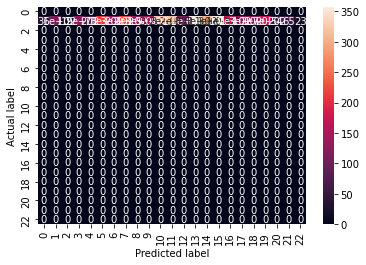

In [334]:
# Making the Confusion Matrix
cm = confusion_matrix(y_pred, y_test)
sns.heatmap(cm,annot=True)
plt.savefig('confusion.png')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

# Confusion Matrix Values

Print the True Positive, True Negative, False Positive, and False Negative values by using python code.

In [335]:
# defining a function which takes acutal and pred values
def confusion_values(y_actual, y_pred):

    # initializing the values with zero value
    TP = 0
    FP = 0
    TN = 0
    FN = 0

    # iterating through the values using a for loop
    for i in range(len(y_pred)): 
        if y_actual[i]==y_pred[i]==1:
           TP += 1
        if y_pred[i]==1 and y_actual[i]!=y_pred[i]:
           FP += 1
        if y_actual[i]==y_pred[i]==0:
           TN += 1
        if y_pred[i]==0 and y_actual[i]!=y_pred[i]:
           FN += 1

    # printing the values
    print("True Positive: ", TP)
    print("False Positive:", FP)
    print("True Negative: ", TN)
    print("False Negative: ", FN)

# calling the function and passing in the parameters from the results of the iterations in the for loop
confusion_values(y_test, y_pred)

True Positive:  0
False Positive: 0
True Negative:  0
False Negative:  0


True Positive: A true positive is an outcome where the model correctly predicts the positive class.
True Negative: A true negative is an outcome where the model correctly predicts the negative class.
False Positive: A false negative is an outcome where the model incorrectly predicts the positive class.
False Negative: A false negative is an outcome where the model incorrectly predicts the negative class.

In [336]:
# importing the required module and methods
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print(f'Accuracy-score: {accuracy_score(y_test, y_pred):.3f}')

Accuracy-score: 0.030


In [337]:
from sklearn.linear_model import LinearRegression, Ridge, HuberRegressor, ElasticNetCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor

models = [LinearRegression(),
         Ridge(),
         HuberRegressor(),
         ElasticNetCV(),
         DecisionTreeRegressor(),
         RandomForestRegressor(),
         ExtraTreesRegressor(),
         GradientBoostingRegressor()]

In [338]:
from sklearn import model_selection
def train(model):
    kfold = model_selection.KFold(n_splits=5, random_state=None, shuffle=False)
    pred = model_selection.cross_val_score(model, X, y, cv=kfold, scoring='neg_mean_squared_error')
    cv_score = pred.mean()
    print('Model:',model)
    print('CV score:', abs(cv_score))

In [339]:
   
for model in models:
    train(model)

Model: LinearRegression()
CV score: 1.5045164006277505e-20
Model: Ridge()
CV score: 4.7360732083823674e-09
Model: HuberRegressor()
CV score: 9.82980977063149
Model: ElasticNetCV()
CV score: 1.759169549672127
Model: DecisionTreeRegressor()
CV score: 0.0639935196435804
Model: RandomForestRegressor()
CV score: 0.11346382341028749
Model: ExtraTreesRegressor()
CV score: 0.07842443094370191
Model: GradientBoostingRegressor()
CV score: 0.056734562631243365


# Brazil

In [341]:
brazilagri_crops = pd.read_csv('brazil/FAOSTAT_brazil_5-1-2022(4).csv')
brazilagri_crops.head()

,Domain,Area,Element,Item,Year,Unit,Value
0,Crops and livestock products,Brazil,Area harvested,"Almonds, with shell",2010,ha,NaN
1,Crops and livestock products,Brazil,Area harvested,"Almonds, with shell",2011,ha,NaN
2,Crops and livestock products,Brazil,Area harvested,"Almonds, with shell",2012,ha,NaN
3,Crops and livestock products,Brazil,Area harvested,"Almonds, with shell",2013,ha,NaN
4,Crops and livestock products,Brazil,Area harvested,"Almonds, with shell",2014,ha,NaN


In [342]:
brazilagri_crops.tail()

,Domain,Area,Element,Item,Year,Unit,Value
3604,Crops and livestock products,Brazil,Production,Yams,2016,tonnes,250020.0
3605,Crops and livestock products,Brazil,Production,Yams,2017,tonnes,250302.0
3606,Crops and livestock products,Brazil,Production,Yams,2018,tonnes,249658.0
3607,Crops and livestock products,Brazil,Production,Yams,2019,tonnes,249963.0
3608,Crops and livestock products,Brazil,Production,Yams,2020,tonnes,250268.0


In [343]:
brazilagri_crops.describe()

,Year,Value
count,3609.000000,3.543000e+03
mean,2014.956498,6.041652e+06
std,3.142415,4.418283e+07
min,2010.000000,0.000000e+00
25%,2012.000000,1.412550e+04
50%,2015.000000,1.004600e+05
75%,2018.000000,8.987605e+05
max,2020.000000,7.685942e+08


In [ ]:
brazilagri_crops.info()

In [ ]:
brazilagri_crops.shape

In [ ]:
brazilagri_consumer = pd.read_csv('brazil/FAOSTATbrazil_data_5-1-2022.csv')
brazilagri_consumer.head()

In [ ]:
brazilagri_consumer.tail()

In [ ]:
brazilagri_consumer.describe()

In [ ]:
brazilagri_consumer.info()

In [ ]:
brazilagri_consumer.shape

In [ ]:
df_brazilagri_consumer = brazilagri_consumer[['Year','Value','Months']].drop_duplicates()

In [ ]:
brazildata = pd.merge(brazilagri_crops,df_brazilagri_consumer,left_on="Year",right_on="Year", how ="inner")

In [ ]:
brazildata.head()

In [ ]:
brazildata.tail()

In [ ]:
brazildata.describe()

In [ ]:
brazildata.info()

In [ ]:
brazildata.shape

In [ ]:
#change all year type to ints to ensure there are no strings for the years greater than 2009 and this covers the years for this data 2010 to 2020
#The second 3rd line we we ensure that year is ints again sometimes after sorting or merging they can turn into strings

df_brazildata = brazildata[brazildata['Year'].astype('int64') > 2009]
df_brazildata = df_brazildata.sort_values(by=['Year','Value_x','Value_y'])
df_brazildata['Year'] = df_brazildata['Year'].astype('int64')
df_brazildata.head()

In [ ]:
df_brazildata.shape

In [ ]:
#Rename our columns to be more descriptive names for some and ensure all of the uppercase ones are 
#lowercase to keep in line with naming conventions
df_brazildata = df_brazildata.rename(columns={'Domain':'crops_domain',
                       'Year':'year',
                       'Item':'crops_type',
                       'Value_x':'crop_value',
                       'Element':'crops_action',
                       'Unit':'crop_measurement',
                       'Area':'country',
                       'Months':'months',
                       'Value_y':'consumer_value'})

In [ ]:
df_brazildata.head()

In [ ]:
#Reorder Columns

brazilcolumns = ["year","country","months","crop_measurement","crops_type","crops_action","crop_value","consumer_value"]
df_brazildata = df_brazildata.reindex(columns = brazilcolumns)

# Data Exploration & Cleaning

# Missing Data

In [ ]:
# check all columns for NAN values if any

df_brazildata.isna().any()

In [ ]:
# check the sum of null records
df_brazildata.isnull().sum()

In [ ]:
#Checking dataframe for missing data
%matplotlib inline
plt.figure(figsize=(10, 5))
colourmap = sns.cubehelix_palette(light=1, as_cmap=True, reverse=True)
sns.heatmap(df_brazildata.isnull(), cmap=colourmap)

In [ ]:
#To zoom in on the missing data
missing_data = df_brazildata.iloc[:, 6:7]
plt.figure(figsize=(20, 10))
colourmap = sns.cubehelix_palette(light=1, as_cmap=True, reverse=True)
sns.heatmap(missing_data.isnull(), cmap=colourmap)

In [ ]:
import plotly.express as px
fig = px.box(df_brazildata, y='consumer_value')
fig.show()

In [ ]:
import seaborn as sns
#
# Box plot
#
sns.boxplot(df_brazildata.crop_value)

In [ ]:
sns.boxplot(x=df_brazildata['consumer_value'])

In [ ]:
#
# Distribution plot
#
sns.distplot(df_brazildata.crop_value)

In [ ]:
##check rows where dependent variable is equal to zero
df_brazildata.loc[df_brazildata['crop_value']==0]

In [ ]:
#We can see for the crop value column there are over 612 rows with the value 0 I we want to find the mean value of the column
print(df_brazildata['crop_value'].mean()) 

In [ ]:
#For all rows with zero for the column crop_value replace them with the average value listed above and below.
df_brazildata['crop_value'] = df_brazildata['crop_value'].replace(0, 6041652.271239063) 

In [ ]:
#We have 2.376 rows for the column crop_value that are null I am going to replace them too with the mean average value for that feature
# Replace NaNs in column crop_value with the
# mean of values in the same column
mean_value=df_brazildata['crop_value'].mean()
df_brazildata['crop_value'].fillna(value=mean_value, inplace=True)
print('Updated Dataframe:')
print(df_brazildata)

In [ ]:
# check the sum of null records again it should be 0 this time

df_brazildata.isnull().sum()

In [ ]:
plt.figure(figsize = (16,4))
sns.boxplot(x= df_brazildata['crop_value'])
plt.show()

In [ ]:
##check cardinality

v_cardinality = df_brazildata.nunique()

print(v_cardinality)

In [ ]:
##check cardinality
v_cardinality = df_brazildata.nunique()
print(v_cardinality)


In [ ]:
##plot cardinality using a barplot

df_brazildata.nunique().plot.bar(figsize=(12,6))

plt.ylabel('Number of unique categories')

plt.xlabel('Variables')

plt.title('Cardinality')

In [ ]:
#checking the shape and size
print("Shape of the dataset is : ",df_brazildata.shape)
print("Size of the dataset is : ",df_brazildata.size)

In [ ]:
#Box plot visualisation to depict the crop price from 2010 to 2020
plt.figure(figsize = (16,4))
sns.boxplot(x='year', y='crop_value', data=df_brazildata)
plt.show()

In [ ]:
#Box plot visualisation to depict the crop price from 2010 to 2020
plt.figure(figsize = (16,4))
sns.boxplot(x='year', y='consumer_value', data=df_brazildata)
plt.show()

In [ ]:
import plotly.express as px

fig = px.bar(df_brazildata, x='year', y='crop_value',)
fig.show()

In [ ]:
import plotly.express as px

fig = px.bar(df_brazildata, x='year', y='consumer_value',)
fig.show()

In [ ]:
df_brazildata.head()

In [ ]:
#create two arrays to compare coefficients
consumervalue=np.array(df_brazildata["consumer_value"])
cropvalue=np.array(df_brazildata["crop_value"])

In [ ]:
#how to work out coefficients between gdp and 
np.corrcoef (consumervalue, cropvalue)

# The result tells us that there is a high correlation between consumer value and cropvalue

Below is a scatterplot to plot the results

In [ ]:
import plotly.express as px

In [ ]:
#Were creating two variables for our min and max values for the slider
xmin,xmax=min(df_brazildata["year"]), max(df_brazildata["year"])
ymin,ymax=min(df_brazildata["consumer_value"]), max(df_brazildata["consumer_value"])

In [ ]:
fig=px.scatter(df_brazildata, x="year", y="consumer_value",
animation_frame="year",
animation_group='crops_action', color="crops_type", hover_name="crops_type",
size_max = 50,
#range_x=[0.1, 50], range_y=[100,60000],
range_x=[xmin,xmax],range_y=[ymin,ymax])
log_x=True, log_y=True)
fig.show()

In [ ]:
import plotly.express as px

In [ ]:
#Were creating two variables for our min and max values for the slider
xmin,xmax=min(df_brazildata["year"]), max(df_brazildata["year"])
ymin,ymax=min(df_brazildata["crop_value"]), max(df_brazildata["crop_value"])

In [ ]:
#Using year as the animation frame, and as we go through each year the values will change want to group it by country
#The color will be the region each region will have a different color, using hover for the country to give us info
#Split up the regions by using facet hight 1580 in pixels, lots of large and small values in gdp so were going to use log
#to be able to see all the values, we can do the same with y.  Size is used for size of points
fig= px.scatter(df_brazildata, x="year", y="crop_value", animation_frame ="year",
               animation_group="crops_action",color="crops_type", hover_name="months", 
               facet_col="crop_value", width=1580, height=400, log_x=True, size_max=45,
               range_x=[xmin,xmax],range_y=[ymin,ymax])

In [ ]:
fig.show()

In [ ]:
df_brazildata.head()

# EU Price of Crops in Euros

In [ ]:
# importing packages
import pandas as pd
import numpy as np
import seaborn as sns
import datetime as dt
from cmath import sqrt
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')

In [ ]:
europeagri_consumer = pd.read_csv('EU/apri_ap_crpouta_1_Data.csv')
europeagri_consumer.head()

In [ ]:
europeagri_consumer.tail()

In [ ]:
europeagri_consumer.info()

In [ ]:
#changing the datatype of Value from object to a float must be careful to check if there are no numbers in the column they
#will be come NAN
europeagri_consumer['Value'] = pd.to_numeric(europeagri_consumer['Value'],errors = 'coerce')

In [ ]:
print(europeagri_consumer.info())

In [ ]:
europeagri_consumer.describe()

In [ ]:
europeagri_consumer.shape

In [ ]:
europeagri_consumer.dtypes

# Check for and Handle MIssing Values

In [ ]:
# check all columns for NAN values if any

europeagri_consumer.isna().any()

In [ ]:
# check the sum of null records

europeagri_consumer.isnull().sum()

In [ ]:
#Using boxplot to check for outliers in the feature Value
sns.boxplot(x=europeagri_consumer['Value'])

In [ ]:
#Checking dataframe for missing data
%matplotlib inline
plt.figure(figsize=(10, 5))
colourmap = sns.cubehelix_palette(light=1, as_cmap=True, reverse=True)
sns.heatmap(europeagri_consumer.isnull(), cmap=colourmap)

In [ ]:
#To zoom in on the missing data
missing_data = europeagri_consumer.iloc[:, 4:5]
plt.figure(figsize=(20, 10))
colourmap = sns.cubehelix_palette(light=1, as_cmap=True, reverse=True)
sns.heatmap(missing_data.isnull(), cmap=colourmap)

In [ ]:
##check cardinality check the unique values

v_cardinality = europeagri_consumer.nunique()

print(v_cardinality)

In [ ]:
# Currency has 2 values I only want Euro so there should only be 1
print(pd.unique(europeagri_consumer['CURRENCY']))

In [ ]:
europeagri_consumer[~europeagri_consumer.CURRENCY.str.contains("National currency") == True]

In [ ]:
#Removing all strings in all rows with the string 'National currency' for the feature CURRENCY
europeagri_consumer = europeagri_consumer[~europeagri_consumer['CURRENCY'].isin(['National currency'])]

In [ ]:
# Checking now that there is only one string Euro under the feature CURRENCY
print(pd.unique(europeagri_consumer['CURRENCY']))

In [ ]:
# Currency has 2 values I only want Euro so there should only be 1
print(pd.unique(europeagri_consumer['GEO']))

In [ ]:
#Removing all strings in all rows with the string 'National currency' for the feature CURRENCY
europeagri_consumer = europeagri_consumer[~europeagri_consumer['GEO'].isin(['United Kingdom'])]

In [ ]:
# Currency has 2 values I only want Euro so there should only be 1
print(pd.unique(europeagri_consumer['GEO']))

In [ ]:
# check all columns for NAN values if any

europeagri_consumer.isna().any()

In [ ]:
#This will give number of NaN values in every column
europeagri_consumer.isnull().sum(axis = 0)

In [ ]:
##This will give number of NaN values in every row
europeagri_consumer.isnull().sum(axis = 1)

In [ ]:
#Filling the Value column where there are NAN's with the mean of that column  If my datatset was larger I would discard
europeagri_consumer['Value'].fillna((europeagri_consumer['Value'].mean()), inplace=True)

In [ ]:
#This will give number of NaN values in every column
europeagri_consumer.isnull().sum(axis = 0)

In [ ]:
#Rename our columns to be more descriptive names for some and ensure all of the uppercase ones are 
#lowercase to keep in line with naming conventions
europeagri_consumer = europeagri_consumer.rename(columns={'TIME':'year',
                       'GEO':'country',
                       'CURRENCY':'euro',
                       'PROD_VEG':'produce_price_load',
                       'Value':'value'})

In [ ]:
#Reorder and reindexing Columns

europecolumns = ["year","country","euro","produce_price_load","value"]
europeagri_consumer = europeagri_consumer.reindex(columns = europecolumns)

In [ ]:
#change all year type to ints to ensure there are no strings for the years greater than 2009 and this covers the years for this data 2010 to 2020
#The second 3rd line we we ensure that year is ints again sometimes after sorting or merging they can turn into strings

df_europeagri_consumer = europeagri_consumer[europeagri_consumer['year'].astype('int64') > 2009]
df_europeagri_consumer = df_europeagri_consumer.sort_values(by=['country', 'year'])
df_europeagri_consumer['year'] = df_europeagri_consumer['year'].astype('int64')
df_europeagri_consumer.head()

In [ ]:
#Box plot visualisation to depict the crop price from 2011 to 2020
plt.figure(figsize = (16,4))
sns.boxplot(y='value', x='year',data=df_europeagri_consumer)
plt.show()

In [ ]:
import plotly.express as px

In [ ]:
#Were creating two variables for our min and max values for the slider
xmin,xmax=min(df_europeagri_consumer["year"]), max(df_europeagri_consumer["year"])
ymin,ymax=min(df_europeagri_consumer["value"]), max(df_europeagri_consumer["value"])

In [ ]:
fig=px.scatter(df_europeagri_consumer, x="year", y="value",
animation_frame="year",
animation_group="produce_price_load", color="country", hover_name="country",
size_max = 50,
range_x=[0.1, 50], range_y=[100,60000],
log_x=True, log_y=True)
fig.show()

In [ ]:
import plotly.express as px

fig = px.bar(df_europeagri_consumer, x='year', y='value',)
fig.show()

In [ ]:
import plotly.express as px

#df = px.data.gapminder().query("country == 'Canada'")
fig = px.bar(df_europeagri_consumer, x='year', y='value',
             hover_data=['country', 'produce_price_load'], color='produce_price_load',
             labels={'country':'Crops Produced each year by value and country'}, height=400, title='Evolution of world GDP')

fig.show()

In [ ]:
import plotly.express as px
import pandas as pd

#df = px.data.gapminder()
gdp = df_europeagri_consumer['country']
fig = px.bar(df_europeagri_consumer, x='year', y='value', color='country', labels={'produce_price_load':'value'},
             hover_data=['produce_price_load'],
             title='Evolution of world GDP')
fig.show()

In [ ]:
import plotly.express as px

#df = px.data.gapminder().query("country == 'Canada'")
fig = px.bar(df_europeagri_consumer, x='country', y='value',
             hover_data=['country', 'produce_price_load'], color='produce_price_load',
             labels={'country':'Crops Produced each year by value and country'}, height=400, title='Value of crops produced by each EU Country')

fig.show()

In [ ]:
import plotly.express as px
#df = px.data.tips()
fig = px.bar(df_europeagri_consumer, x="year", y="value", color="year", barmode="group", facet_row="produce_price_load", facet_col="year",
       category_orders={"country": ["ireland", "spain", "france", "germany"], "produce_price_load": ["barley - prices per 100kg"]})
fig.show()

In [ ]:
europeagri_producer = pd.read_csv('EU/FAOSTAT_data_5-9-2022(1).csv')
europeagri_producer.head()

In [ ]:
import plotly.express as px

In [ ]:
#Were creating two variables for our min and max values for the slider
xmin,xmax=min(df_irishdata["year"]), max(df_irishdata["year"])
ymin,ymax=min(df_irishdata["crop_value"]), max(df_irishdata["crop_value"])

In [ ]:
px.scatter(europeagri_producer, x="crop_value", y="consumer_value",
animation_frame="year",
animation_group="country", color="crops_type", hover_name="country",
size_max = 50,
range_x=[0.1, 50], range_y=[100,60000],
log_x=True, log_y=True)
fig.show()